In [13]:
### RUN EVERY TIME: GRAVITY DATASETS EXPLORING

In [14]:
### RUN EVERY TIME: INITIALIZATION

import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import numpy as np
import math
import gc
import datetime
import time ### UN COMTRADE Only
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import seaborn as sns
from matplotlib.cbook import boxplot_stats ### To annotate fliers
import os
#%load_ext line_profiler

In [15]:
### RUN EVERY TIME: VERSION CONTROL

from platform import python_version
print('pandas version: ', pd.__version__)
print('python version: ', python_version())

pandas version:  0.25.3
python version:  3.7.4


In [16]:
### RUN EVERY TIME: MAIN CONSTANTS

### MultiIndex level slice constant:
All = slice(None)
### Regions list:
list_regions = ['DM', 'EM', 'FM']
### Universe path:
str_path_universe = 'Data_Files/Source_Files/acadian_universe.xlsx'
### Activities naming:
dict_activity = {}
dict_activity['imf_dots'] = 'Trade Export'
dict_activity['imf_cpis'] = 'Portfolio Investment'
dict_activity['oecd_fdi'] = 'Direct Investment'
dict_activity['bis_lbs'] = 'Bank Lending'
dict_activity['gravity'] = 'Gravity'
### CEPII dataset:
str_path_cepii_dataset = 'Data_Files/Source_Files/cepii_dataset.h5'
str_distance_dataset = 'distance_dataset'
### WB WDI GDP dataset:
str_path_wb_gdp_dataset = 'Data_Files/Source_Files/gdp_dataset.h5'
str_wb_gdp_dataset = 'gdp_dataset'
### BIS Loans dataset:
str_path_bis_lbs_combined = 'Data_Files/Source_Files/bis_combined.h5'
str_full_bis_lbs_combined = 'bis_full_combined'
### IMF CPIS dataset:
str_path_imf_cpis_combined = 'Data_Files/Source_Files/cpis_combined.h5'
str_full_imf_cpis_combined = 'cpis_full_combined'
### IMF DOTS datasets:
str_path_imf_dots_combined = 'Data_Files/Source_Files/dots_combined.h5'
str_full_imf_dots_combined = 'dots_full_combined'
str_path_imf_dots_world = 'Data_Files/Source_Files/dots_world_export.h5'
str_full_imf_dots_world = 'dots_world_export'
### OECD FDI dataset:
str_path_oecd_fdi_combined = 'Data_Files/Source_Files/oecd_combined.h5'
str_full_oecd_fdi_combined = 'oecd_full_combined'
### Technical Constants:
date_start = pd.Timestamp('1989-12-29')
str_date_end = '2021-12-31'
date_end = pd.Timestamp(str_date_end)
date_ison = pd.Timestamp('1994-12-31')
### Distance power for gravity calculation:
flo_dist_power = 1 # 1 / 2
### Bloomberg structured data extraction parameters:
str_path_bb_hdf = 'Data_Files/Source_Files/Bloomberg_prepared.h5'
str_key_ret_daily = 'bb_ret_daily'
str_path_ret_csv = 'Data_Files/Source_Files/ret_daily.csv'
### Saved annualized activities:
str_path_act_annualized = 'Data_Files/Source_Files/datasets_annualized.h5'
str_path_act_weights = 'Data_Files/Source_Files/datasets_weights.h5'
### Herfindahl index threshold:
flo_hi_threshold = 0.0 # 1.1
### Saved herfindahl values:
str_path_herfindahl = 'Data_Files/Source_Files/herfindahl indices.h5'
### Returns average parameters:
int_ave_months = 6
int_halflife_months = 2
### Saved weighted returns:
str_path_ret_weighted = 'Data_Files/Source_Files/returns_weighted.h5'
str_key_weighted = 'ret_weighted'
### Saved export data:
str_path_gravity_results = 'Data_Files/Source_Files/gravity_export.h5'
str_key_activity_sum = 'activity_sum'
str_key_activity_share = 'activity_share'
str_key_gdp_total = 'gdp_total'
str_key_herfindahl = 'herfindahl_index'
str_key_openess = 'openess_measure'
str_key_ret_weighted = 'ret_weighted'
### CSV to Export data:
str_activity_sum_csv_path = 'Data_Files/Test_Files/activity_sum.csv'
str_activity_share_csv_path = 'Data_Files/Test_Files/activity_share.csv'
str_gdp_total_csv_path = 'Data_Files/Test_Files/gdp_total.csv'
str_herfindahl_csv_path = 'Data_Files/Test_Files/herfindahl.csv'
str_openess_csv_path = 'Data_Files/Test_Files/openess.csv'
str_ret_weighted_csv_path = 'Data_Files/Test_Files/ret_weighted.csv'

In [17]:
### DEFINING EXPONENTIAL WEIGHT

def exp_weight_single(halflife_len = 3, num_element = 0):
    ### Weight calculating:
    num_period_factor = math.exp(math.log(0.5) / round(halflife_len))
    num_weight = np.exp(math.log(num_period_factor) * num_element)
    ### Result output:
    return num_weight

In [18]:
### DEFINING WEIGHTED AVERAGE

def weighted_average(ser_data, ser_weight = False, int_min_count = 0):
    ### Default output:
    num_result = np.NaN
    ### Checking for data presence:
    if (ser_data.count() > int_min_count):       
        ### Checking for weights dataset:
        if isinstance(ser_weight, bool):
            ### Calculating of simple average:
            num_result = np.nanmean(ser_data.values)
        else:
            ### Weights filtering:
            list_weight = ser_weight[ser_data.dropna().index].values
            ### Checking for weights presence:
            if np.nansum(list_weight):
                ### Data filtering:
                list_data = ser_data.dropna().values
                ### Weighted average calculating:
                num_result = np.nansum(list_data * list_weight) / np.nansum(list_weight)
    ### Results output:
    return num_result

In [19]:
### DEFINING COUNTRY CODES EXTRACTOR

def get_country_codes(use_local_copy = False):  
    ### In case if URL is unavailable:
    if (use_local_copy):
        url_country_code = 'Data_Files/Source_Files/countrycode.html'
    ### Online extraction:
    else:
        url_country_code = 'https://countrycode.org/'
    df_full_codes = pd.read_html(url_country_code, index_col = 'COUNTRY')[0]
    df_full_codes[['ISO SHORT', 'ISO LONG']] = df_full_codes['ISO CODES'].str.split(' / ', expand = True)
    df_result = df_full_codes[['ISO SHORT', 'ISO LONG']].sort_index()    
    df_result.index = df_result.index.str.upper()
    ### Results output:
    return df_result

In [20]:
### DEFINING EXTRACTION UNIVERSE DATA FROM MS EXCEL SOURCE (TO BE IGNORED IN PRODUCT CODE)

def ison_membership_converting(str_path_universe, date_end, bool_daily = False, int_backfill_months = 0):
    ### Defining business-month-end reindexation on country level:
    def country_modify(ser_raw_country, date_end):
        ser_res_country = ser_raw_country.droplevel(0).resample('MS').last().resample('BM').last()
        range_country = pd.date_range(ser_res_country.index[0], date_end, freq = 'BM')
        return ser_res_country.reindex(range_country).ffill()
    ### Markets encoding table:
    dict_markets = {50 : 'DM', 57 : 'EM', 504 : 'FM', 0: np.NaN}     
    ### Loading source file:
    df_raw_universe = pd.read_excel(engine = 'openpyxl', io = str_path_universe, sheet_name = 'Switchers', header = 0, parse_dates = True, index_col = [0, 1],
                                 na_values = ['', '#N/A', '#N/A N/A', '#NA', '-1.#IND', '-1.#QNAN', '-NaN', '-nan', '1.#IND', 
                                             '1.#QNAN', 'N/A', 'NULL', 'NaN', 'n/a', 'nan', 'null'], keep_default_na = False)
    ### Converting source file:
    df_raw_universe.index.names = ['Country', 'Date']
    ser_raw_universe = df_raw_universe['Region']
    ser_raw_universe.fillna(0, inplace = True)
    ser_raw_universe.name = 'Market'
    ### By country reindexation and translation:
    ser_res_universe = ser_raw_universe.groupby('Country').apply(country_modify, date_end)
    ser_res_universe.index.names = ['Country', 'Date']
    ser_res_universe = ser_res_universe.replace(dict_markets).reorder_levels([1, 0]).sort_index() 
    ### Expanding membership for primary regions members by backfilling:
    if int_backfill_months:
        ### List of regions:
        list_region = list(ser_res_universe.dropna().unique())
        ### Initialising of collection of series with backfilled data for each region:
        list_ison_backfill = []
        ### Regions looping:
        for iter_region in list_region:
            ### Defining start of region date:
            date_first_valid = ser_res_universe.loc[ser_res_universe == iter_region].first_valid_index()[0]
            ### Creating dates index to backfilling:
            idx_date_backfill = pd.date_range(end = date_first_valid, periods = int_backfill_months + 1, freq = 'BM')[: -1]
            ### Creating primary countries index to backfilling:            
            idx_region_backfill = ser_res_universe.loc[ser_res_universe == iter_region].loc[date_first_valid, All].index.get_level_values('Country')
            ### Creating full index:
            idx_ison_backfill = pd.MultiIndex.from_product([idx_date_backfill, idx_region_backfill])
            ### Series with backfilled data:
            list_ison_backfill.append(pd.Series(iter_region, index = idx_ison_backfill))
        ### Combination of backfilled series and original ISON data:    
        ser_res_universe = ser_res_universe.combine_first(pd.concat(list_ison_backfill, axis = 0)).sort_index()  
        ser_res_universe.index.names = ['Date', 'Country']
    ### Converting to daily frequency:
    if bool_daily:
        ser_res_universe = ser_res_universe.reset_index('Country').groupby('Country').resample('B').ffill()['Market'].swaplevel().sort_index()    
    ### Results output:
    ser_res_universe.name = 'Market'
    return ser_res_universe

In [9]:
### RUN EVERY TIME: COMMON DATA EXTRACTION STEPS

### World Country Codes:
df_country_codes = get_country_codes()
### ISON membership history:
ser_ison_membership = ison_membership_converting(str_path_universe, pd.to_datetime(str_date_end))
### ISON LONG IDs list:
list_ison_long = list(df_country_codes.loc[df_country_codes['ISO SHORT'].isin(ser_ison_membership.index.get_level_values('Country').unique()), 'ISO LONG'].values)
### ISON current status:
ser_ison_status = ser_ison_membership.loc[str_date_end].droplevel('Date')
ser_ison_status.index.names = ['Reporter']
### ISON stats:
int_ison_number = len(sorted(ser_ison_membership.index.get_level_values(1).unique()))
dict_ison_len = {}
list_regions = ['DM', 'EM', 'FM']
dict_ison_len['ISON'] = len(ser_ison_status)
for iter_region in list_regions:
    dict_ison_len[iter_region] = len(ser_ison_status[ser_ison_status == iter_region])
ser_market_len = pd.Series(dict_ison_len)
ser_market_len.index.names = ['Market']    

In [10]:
### RUN EVERY TIME: DATASETS LOADING

dict_dataset = {}
dict_dataset['imf_dots'] = pd.read_hdf(path_or_buf = str_path_imf_dots_combined, key = str_full_imf_dots_combined)\
                             .set_index(['Date', 'Reporter', 'Partner']).sort_index()['Export_Augmented']
dict_dataset['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_imf_cpis_combined, key = str_full_imf_cpis_combined)\
                             .set_index(['Date', 'Reporter', 'Partner']).sort_index()['Asset_Augmented']
dict_dataset['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_oecd_fdi_combined, key = str_full_oecd_fdi_combined)\
                             .set_index(['Date', 'Reporter', 'Partner']).sort_index()['Asset_Augmented']
dict_dataset['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_bis_lbs_combined, key = str_full_bis_lbs_combined)\
                             .set_index(['Date', 'Reporter', 'Partner']).sort_index()['Claim_Augmented']

gc.collect()

886

In [11]:
### RUN EVERY TIME: GRAVITY DATASET CONSTRUCTION

### GDP loading:
ser_gdp = pd.read_hdf(path_or_buf = str_path_wb_gdp_dataset, key = str_wb_gdp_dataset)
### Distances loading:
ser_dist = pd.read_hdf(path_or_buf = str_path_cepii_dataset, key = str_distance_dataset)['distw']
### Distances naming:
ser_dist.index.names = ['Reporter', 'Partner']
ser_dist.name = 'Distance'
### Dropping internal distances:
df_dist = ser_dist.reset_index()
df_dist.drop(df_dist[df_dist['Reporter'] == df_dist['Partner']].index, inplace = True)
ser_dist = df_dist.set_index(['Reporter', 'Partner']).squeeze().sort_index()
### GDP duplicating:
ser_gdp_reporter = ser_gdp[:]
ser_gdp_reporter.index.names = ['Date', 'Reporter']
ser_gdp_reporter.name = 'GDP_Reporter'
ser_gdp_partner = ser_gdp[:]
ser_gdp_partner.index.names = ['Date', 'Partner']
ser_gdp_partner.name = 'GDP_Partner'
### Reporters data connecting:
df_reporter = ser_dist.to_frame().join(ser_gdp_reporter).sort_index()
### Partners data connecting:
df_partner = ser_dist.to_frame().join(ser_gdp_partner).drop('Distance', axis = 1).sort_index()
df_partner = df_partner.reorder_levels([1, 0, 2])
### Joining data and Gravity calculation:
df_gravity = pd.concat([df_reporter, df_partner], axis = 1)
df_gravity = df_gravity.reset_index('Date').dropna(subset = ['Date']).set_index('Date', append = True).reorder_levels([2, 0, 1]).sort_index()
display(df_gravity.loc[('2020-12-31', ['US', 'IL'], ['US', 'IL']), :])
ser_gravity = (df_gravity['GDP_Partner'] / 10 ** 9) / (df_gravity['Distance'] ** flo_dist_power)
#ser_gravity = (df_gravity['GDP_Reporter'] / 10 ** 9) * (df_gravity['GDP_Partner'] / 10 ** 9) / (df_gravity['Distance'] ** flo_dist_power)
### Adding gravity to activities:
dict_dataset['gravity'] = ser_gravity.sort_index()

Distance  GDP_Reporter   GDP_Partner
Date       Reporter Partner                                      
2020-12-31 IL       US        10516.0  4.071007e+11  2.089374e+13
           US       IL        10516.0  2.089374e+13  4.071007e+11

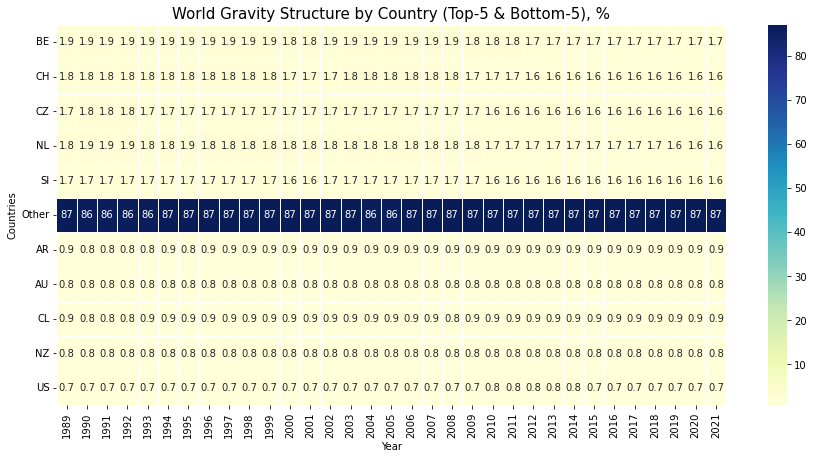

In [42]:
### GRAVITY: STATS: LEADERS

gc.collect()
### Stats parameter - leaders to plot:
int_top = 5
### Stats parameter - years to define leaders:
int_term = 10
### ISON total volume:
ser_total_volume = dict_dataset['gravity'].dropna().groupby('Date').sum()
### Country trade proprotion for each date:
ser_country_value = dict_dataset['gravity'].groupby(['Date', 'Reporter']).sum().dropna()
df_country_part = (ser_country_value / ser_total_volume).round(3).reset_index()
df_country_part['Year'] = df_country_part['Date'].dt.year
ser_country_part = df_country_part.set_index(['Year', 'Reporter']).drop('Date', axis = 1).squeeze().sort_index()
### Limited by term country trade volume:
ser_country_sum = ser_country_value.groupby('Reporter').apply(lambda ser_group: ser_group.iloc[-int_term :].sum()).sort_values(ascending = False).drop('TW', axis = 0)
### Top countries list:
idx_ave_top = ser_country_sum[: int_top].index
### Other countries list:
idx_ave_other = ser_country_sum[int_top : -int_top].index
### Other countries list:
idx_ave_bottom = ser_country_sum[-int_top :].index
### Top countries proportions extracting:
ser_country_top = (ser_country_part.loc[All, idx_ave_top] * 100)
ser_country_top.index.set_levels(ser_country_top.index.levels[1].astype('O'), level = 'Reporter', inplace = True) 
### Other countries proportions extracting:
ser_country_other = (ser_country_part.loc[All, idx_ave_other].groupby('Year').sum() * 100).astype(int)
ser_country_other = pd.concat({'Other': ser_country_other[ser_country_other > 0]}, names = ['Reporter']).swaplevel()
### Top countries proportions extracting:
ser_country_bottom = (ser_country_part.loc[All, idx_ave_bottom] * 100)
ser_country_bottom.index.set_levels(ser_country_bottom.index.levels[1].astype('O'), level = 'Reporter', inplace = True) 
### Data consolidating:
df_to_plot = pd.concat([ser_country_top.unstack('Year').sort_index(), ser_country_other.unstack('Year'), ser_country_bottom.unstack('Year')], axis = 0)
### Results plotting:
plt.figure(figsize = (15, 7))
ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True)
ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
ax_heatmap.set_title('World Gravity Structure by Country (Top-' + str(int_top) + ' & Bottom-' + str(int_top) + '), %', fontsize = 15)
plt.yticks(rotation = 0)
plt.show()   

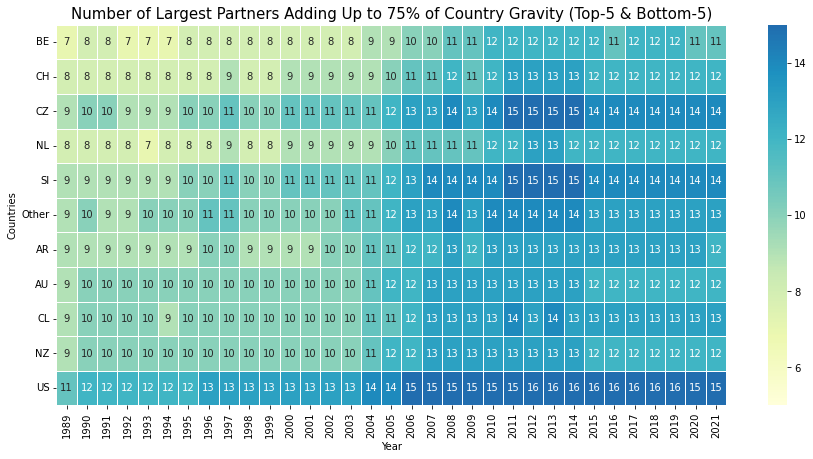

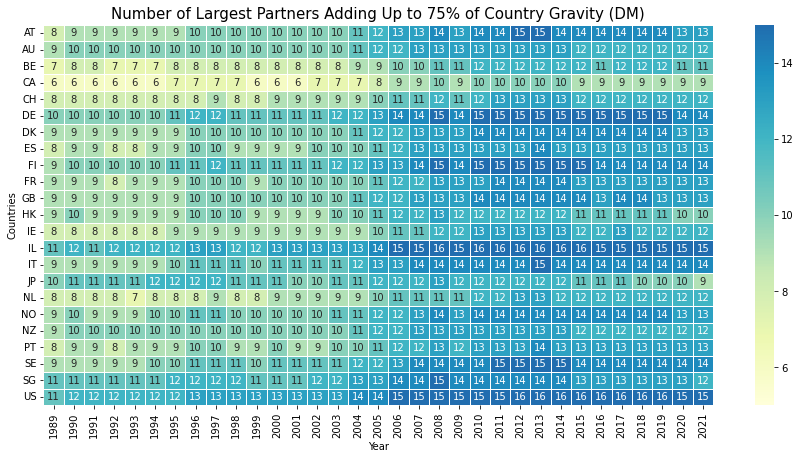

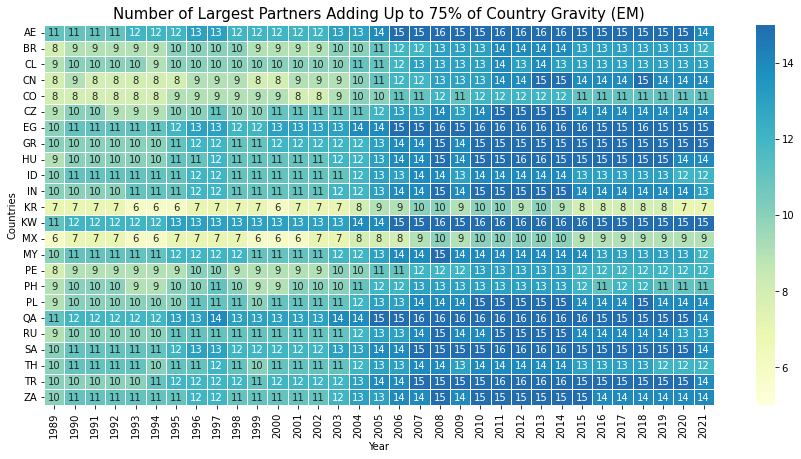

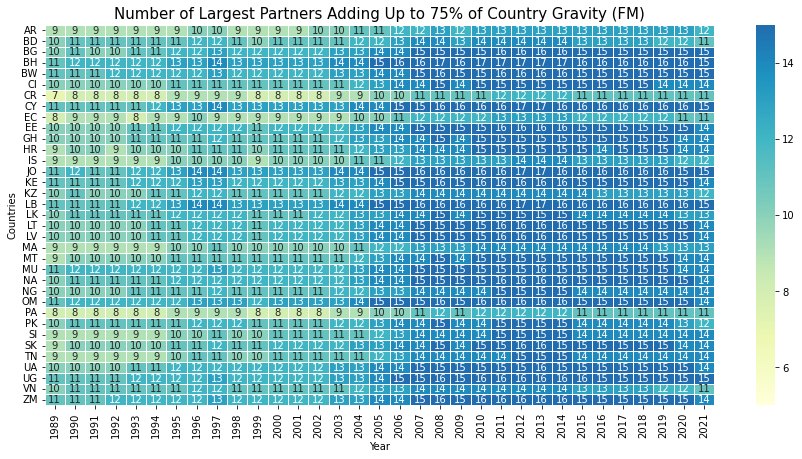

In [53]:
### GRAVITY: STATS: NUMBER OF PARTNERS TO COMPLETE FIXED % OF GRAVITY FOR COUNTRY

gc.collect()
### Defining top-% partners number calculation procedure:
def get_top_partners(ser_group, flo_perc):
    ser_by_partner = ser_group.groupby(['Date', 'Partner']).sum().dropna().sort_values(ascending = False)
    ser_cum_sum = ser_by_partner.cumsum() / ser_by_partner.sum()
    return len(ser_cum_sum[ser_cum_sum < flo_perc]) + 1
### Stats parameter - top bound:
flo_perc = 0.75
### Stats parameter - leaders to plot:
int_top = 5
### Top countries list:
idx_ave_top = ser_country_sum[: int_top].index
### Other countries list:
idx_ave_other = ser_country_sum[int_top : -int_top].index
### Other countries list:
idx_ave_bottom = ser_country_sum[-int_top :].index
### Partners number calculation for each Date / Reporter pair:
ser_partners = dict_dataset['gravity'].groupby(['Date', 'Reporter']).apply(get_top_partners, flo_perc).dropna().astype(int)#.drop('TW')
ser_partners.name = 'Number'
df_partners = ser_partners.to_frame().join(ser_ison_status, on = 'Reporter').reset_index()
### Leaders data extraction for leaders plot:
df_top_part = df_partners[df_partners['Reporter'].isin(idx_ave_top)].copy()
df_top_part['Year'] = df_top_part['Date'].dt.year
df_top_part = df_top_part.drop(['Date', 'Market'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
df_top_part.index = df_top_part.index.astype('O')
### Other countries data extraction for leaders plot:
df_other_part = df_partners[df_partners['Reporter'].isin(idx_ave_other)].groupby('Date')['Number'].mean().astype(int).reset_index()
df_other_part['Year'] = df_other_part['Date'].dt.year
df_other_part = pd.concat({'Other': df_other_part.set_index('Year')}, names = ['Reporter'])
df_other_part = df_other_part.drop('Date', axis = 1).squeeze().unstack('Year')
### Outsiders data extraction for leaders plot:
df_bottom_part = df_partners[df_partners['Reporter'].isin(idx_ave_bottom)].copy()
df_bottom_part['Year'] = df_bottom_part['Date'].dt.year
df_bottom_part = df_bottom_part.drop(['Date', 'Market'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
df_bottom_part.index = df_bottom_part.index.astype('O')
### Leaders plot data aggregation:
df_to_plot = pd.concat([df_top_part, df_other_part, df_bottom_part], axis = 0)
### Leaders plot plotting:
plt.figure(figsize = (15, 7))
ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True, 
                         center = 12, vmin = 5, vmax = 15)
ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
ax_heatmap.set_title('Number of Largest Partners Adding Up to ' + str(int(flo_perc * 100)) + '% of Country Gravity ' + 
                     '(Top-' + str(int_top) + ' & Bottom-' + str(int_top) + ')' , fontsize = 15)
plt.yticks(rotation = 0)
plt.show()
### Region's data plotting:
for iter_region in list_regions:
    ### Data extraction:    
    df_to_plot = df_partners.loc[(df_partners['Market'] == iter_region) & (df_partners['Reporter'] != 'TW')].copy()
    df_to_plot['Year'] = df_to_plot['Date'].dt.year
    df_to_plot = df_to_plot.drop(['Date', 'Market'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
    ### Results plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True, 
                             center = 12, vmin = 5, vmax = 15)
    ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
    ax_heatmap.set_title('Number of Largest Partners Adding Up to ' + str(int(flo_perc * 100)) + '% of Country Gravity (' + iter_region + ')' , fontsize = 15)
    plt.yticks(rotation = 0)
    plt.show()  

imf_dots : Countries not reported on the last observed date : []
imf_dots : Countries not reported on the last  60 observed months: []
imf_dots : Mean portion of partners available for the last observed date in proprotion to last 60 observed months average:


Market
DM    1.001730
EM    1.005429
FM    1.031882
Name: Proportion to average value, dtype: float64

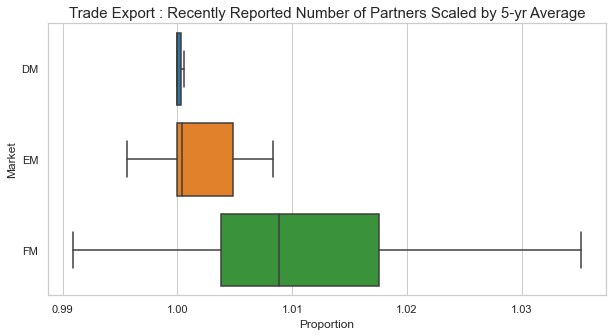

imf_cpis : Countries not reported on the last observed date : ['CI', 'ZM']
imf_cpis : Countries not reported on the last  60 observed months: []
imf_cpis : Mean portion of partners available for the last observed date in proprotion to last 60 observed months average:


Market
DM    1.035588
EM    0.984444
FM    0.966684
Name: Proportion to average value, dtype: float64

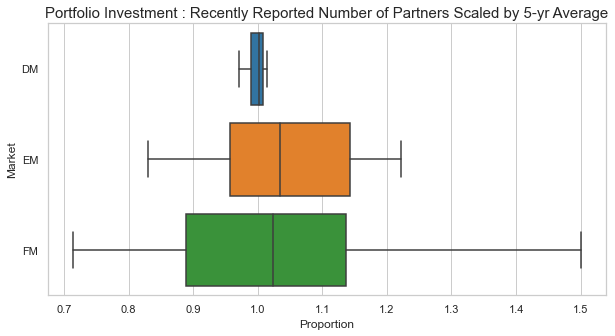

oecd_fdi : Countries not reported on the last observed date : []
oecd_fdi : Countries not reported on the last  60 observed months: []
oecd_fdi : Mean portion of partners available for the last observed date in proprotion to last 60 observed months average:


Market
DM    0.991678
EM    1.031635
FM    1.088114
Name: Proportion to average value, dtype: float64

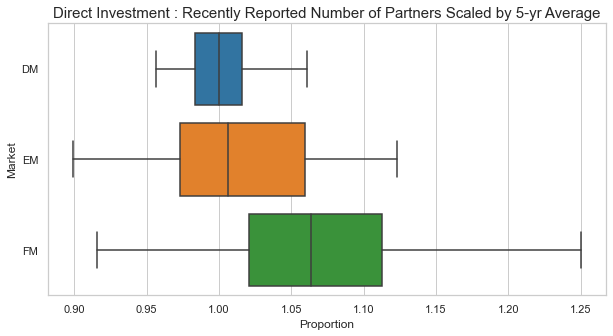

bis_lbs : Countries not reported on the last observed date : []
bis_lbs : Countries not reported on the last  60 observed months: []
bis_lbs : Mean portion of partners available for the last observed date in proprotion to last 60 observed months average:


Market
DM    1.011073
EM    1.020367
FM    1.002371
Name: Proportion to average value, dtype: float64

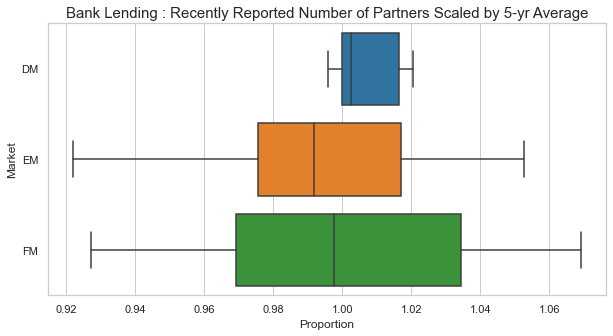

gravity : Countries not reported on the last observed date : ['AE', 'KW', 'TW']
gravity : Countries not reported on the last  60 observed months: ['TW']
gravity : Mean portion of partners available for the last observed date in proprotion to last 60 observed months average:


Market
DM    0.975309
EM    0.894033
FM    0.975309
Name: Proportion to average value, dtype: float64

gravity : No boxplot to show


In [21]:
### TEST: LAST DATE COMPLETENESS CHECK

### Months to find maximum of partners for each reporter:
int_max_term = 60
### Looping over activities datasets:
for iter_dataset in dict_dataset:
#for iter_dataset in ['imf_cpis']:    
    ### Region adding:
    ser_isoned = dict_dataset[iter_dataset].to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
    ### The most fresh date search:
    list_dates_sorted = sorted(ser_isoned.index.get_level_values('Date').unique())
    date_last = list_dates_sorted[-1]
    date_prev = list_dates_sorted[-2]
    ### Last date partners number:
    ser_last = ser_isoned[date_last].groupby(['Reporter', 'Market']).count()
    ### Maximum / Average partners number for the last years:
    ser_mean = ser_isoned[date_last - pd.offsets.BMonthEnd(int_max_term) : date_prev].groupby(['Date', 'Reporter', 'Market']).count()\
                                                                                    .groupby(['Reporter', 'Market']).mean().dropna()    
    ### Last available proportion calculating:
    print(iter_dataset + ' : Countries not reported on the last observed date :',  ser_last[ser_last == 0].droplevel('Market').index.to_list())
    print(iter_dataset + ' : Countries not reported on the last  ' + str(int_max_term) + ' observed months:',  
          ser_mean[ser_mean == 0].droplevel('Market').index.to_list())
    print(iter_dataset + ' : Mean portion of partners available for the last observed date in proprotion to last ' + str(int_max_term) + ' observed months average:')
    ser_prop_to_mean = (ser_last / ser_mean)
    ser_prop_to_mean.name = 'Proportion to average value'
    display(ser_prop_to_mean.groupby('Market').mean())
    if ((ser_prop_to_mean.quantile(0.05) / ser_prop_to_mean.quantile(0.95)) < 1 - 0.001):
        ### Last available proprortion to average distribution:
        df_to_plot = ser_prop_to_mean.reset_index()
        sns.set_style('whitegrid')
        plt.figure(figsize = (10, 5))
        sns.set_context('notebook')
        ax_box = sns.boxplot(data = df_to_plot, x = ser_prop_to_mean.name, y = 'Market', order = list_regions, showfliers = False)
        ax_box.set_title(dict_activity[iter_dataset] + ' : Recently Reported Number of Partners Scaled by 5-yr Average', fontsize = 15)
        ax_box.set_xlabel('Proportion')
#        ### Fliers annotation:
#        for iter_num, iter_region in enumerate(list_regions):
#            list_fliers = boxplot_stats(df_to_plot[df_to_plot['Market'] == iter_region].drop(['Reporter', 'Market'], axis = 1))[0]['fliers']
#            int_angle = 60
#            flo_shift = -0.05
#            list_used = []
#            for iter_flier in sorted(list_fliers):
#                str_iter_country = df_to_plot.loc[(df_to_plot['Market'] == iter_region) & 
#                                                  (df_to_plot[ser_prop_to_mean.name] == iter_flier) &
#                                                  ~df_to_plot['Reporter'].isin(list_used)
#                                                  , 'Reporter'].values[0]
#                list_used.append(str_iter_country)
#                ax_box.text(s = str_iter_country, x = iter_flier, y = iter_num + flo_shift, rotation = int_angle)   
#                if (int_angle == 60):
#                    flo_shift = 0.2
#                else:
#                    flo_shift = -0.05
#                int_angle = -int_angle
        ### Boxplot drawing:
        plt.show()
    else:
        print(iter_dataset + ' : No boxplot to show')
#    break  


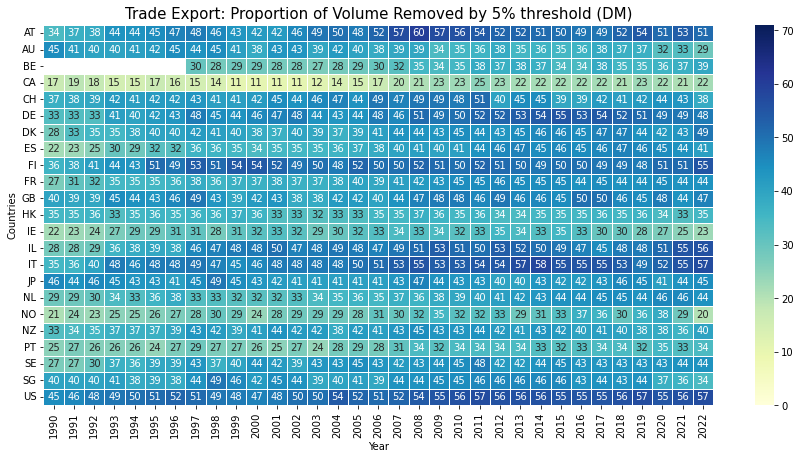

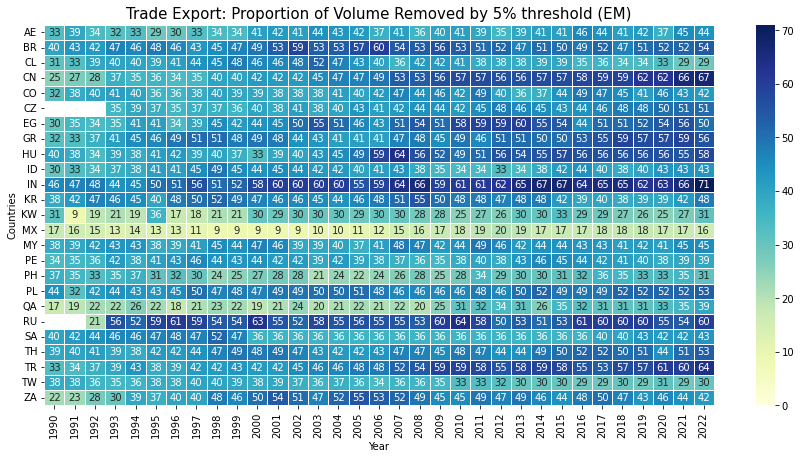

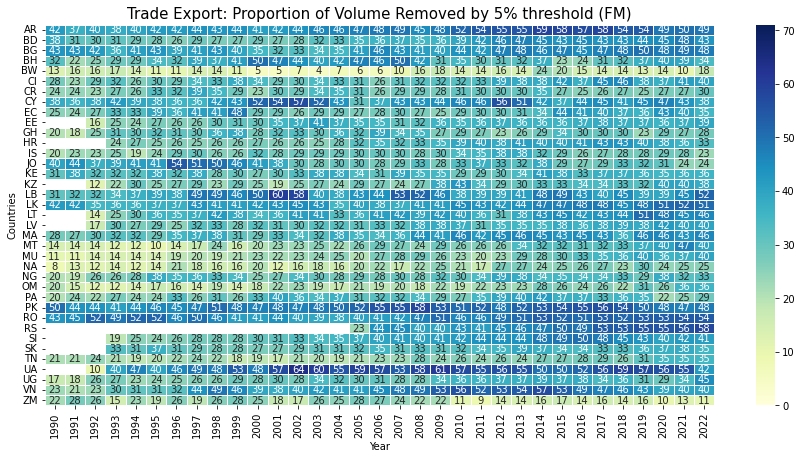

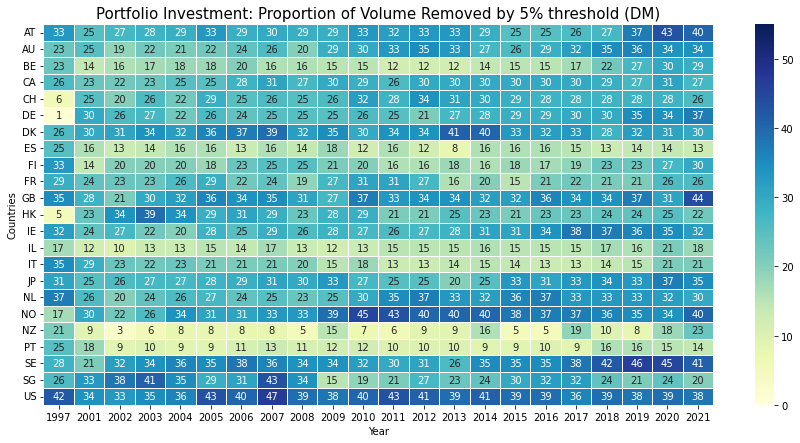

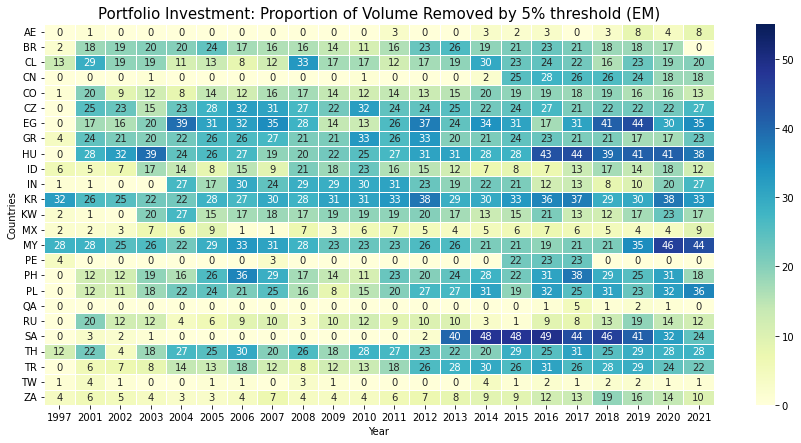

...

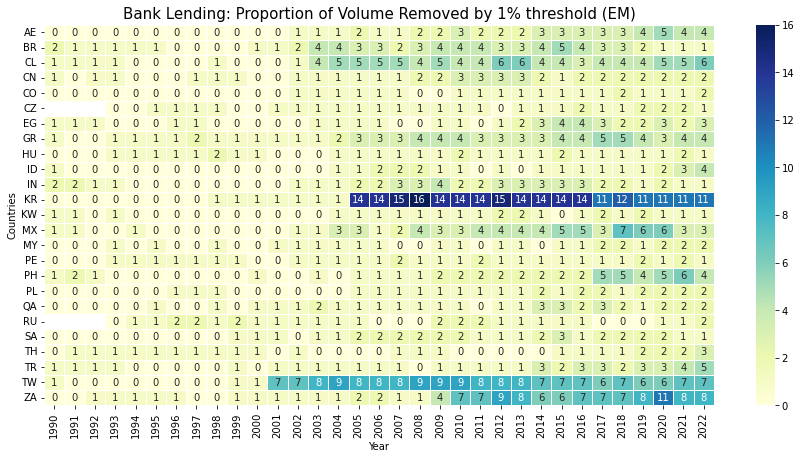

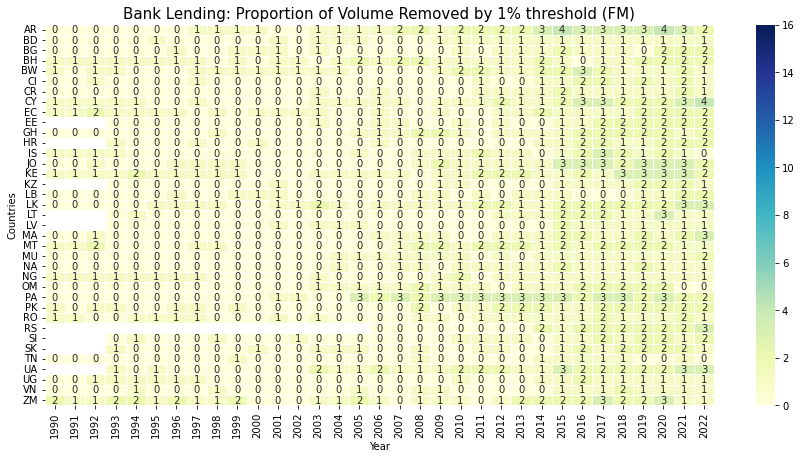

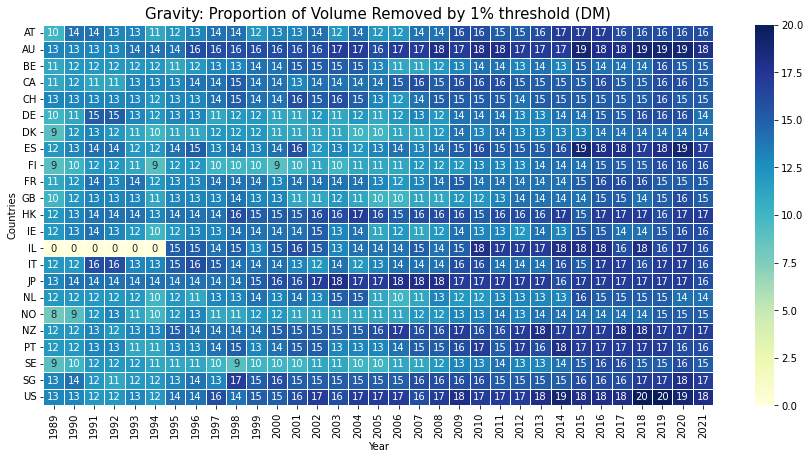

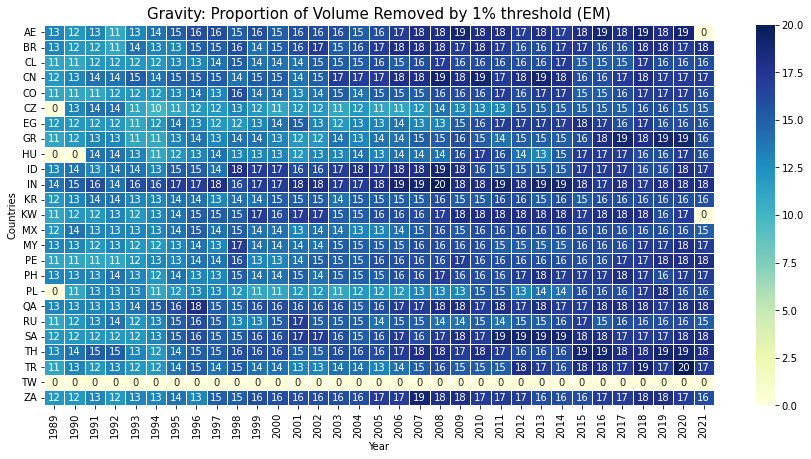

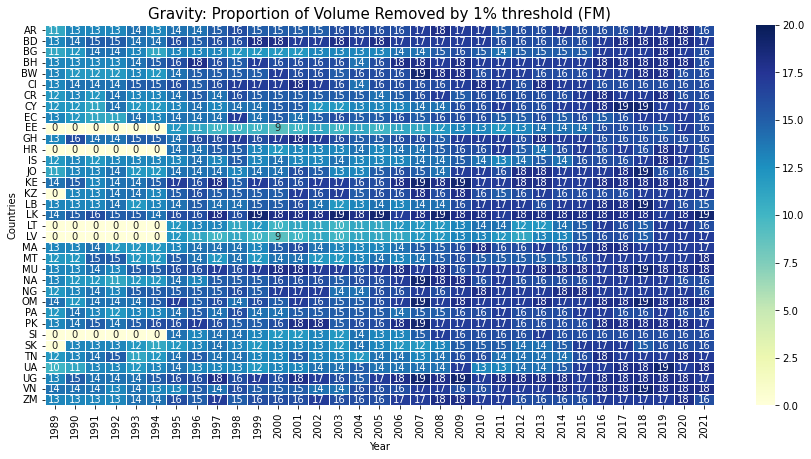

In [13]:
### TEST: THRESHOLD SIZE CALСULATION

### Defining threshold sum calculation:
def clip_threshold(ser_group, flo_limit = 0.05):
    ser_norm = ser_group / ser_group.sum()
    flo_threshold = ser_norm[ser_norm < flo_limit].sum()
    return flo_threshold
### Threshold limits options:
list_limits = [0.05, 0.02, 0.01]
### Looping over threshold limits:
for flo_limit in list_limits:
    gc.collect()
    ### Threshold sum for pairs initialization:
    dict_threshold_full = {}
    ### Mean thresholod sum for reporters initialization:
    dict_threshold_mean = {}
    ### Looping over activities datasets:
    for iter_dataset in dict_dataset:
        ### Threshold sum calculation:
        dict_threshold_full[iter_dataset] = dict_dataset[iter_dataset].groupby(['Date', 'Reporter']).apply(clip_threshold, flo_limit)
        dict_threshold_mean[iter_dataset] = dict_threshold_full[iter_dataset].unstack('Reporter').resample('BY').mean().stack('Reporter').sort_index()
        ### Mean threshold preparation to plot:
        ser_isoned = dict_threshold_mean[iter_dataset].to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
        ser_isoned = (ser_isoned * 100).astype(int)
        ### Looping over regions:
        for iter_region in list_regions:
            ### Dataset formatting:
            df_to_plot = ser_isoned.loc[:, :, iter_region].reset_index()
            df_to_plot['Year'] = df_to_plot['Date'].dt.year
            df_to_plot = df_to_plot.drop(['Date'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
            ### Results plotting:
            plt.figure(figsize = (15, 7))
            ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                     vmin = 0, vmax = ser_isoned.max())
            ### Plot formatting:
            ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
            ax_heatmap.set_title(dict_activity[iter_dataset] + ': Proportion of Volume Removed by ' + str(int(flo_limit * 100)) + '% threshold (' + iter_region + ')',
                                 fontsize = 15)
            plt.yticks(rotation = 0)
            plt.show()  
#            break
#        break        

In [11]:
### RUN EVERY TIME: ACTIVITIES ANNUALIZATION

dict_annualized = {}

def annualize(ser_group):
    ser_ann = ser_group.droplevel(['Reporter', 'Partner'])
    ### Filter not empty pairs:
    if (ser_ann.count() > 0):
        ### Data frequency calculation (observations per year):
        ser_freq = ser_ann.dropna().resample('BY').count()
        int_freq = int(ser_freq[ser_freq > 0].median())
        ### Data periodicity definition (months number covered per one observation):
        int_period = 12 // int_freq
        ### Convert data to monthly frequency:
        if (int_period > 1):
            ### Prepending one more period to backfill first valid observation:
            ser_ann = ser_ann.append(pd.Series(np.NaN, index = [ser_ann.index[0] - pd.offsets.BMonthEnd(int_period)])).sort_index()    
            ### Replace period value to monthly value:
            ser_ann = (ser_ann / int_period)
            ### Backfill monthly value for a whole period:
            ser_ann = ser_ann.resample('BM').bfill(limit = int_period - 1)
            ### Drop dummy observation:
            ser_ann.drop(ser_ann.index[0], inplace = True)
        ### Annualize data:
        ser_ann = ser_ann.rolling(window = 12, min_periods = 12).sum()
    ### Results output:
    return ser_ann
### Deleting existing file with annualized data:
if os.path.exists(str_path_act_annualized):
    os.remove(str_path_act_annualized)
    print(str_path_act_annualized, 'File removed')
### Looping over activities:
for iter_dataset in dict_dataset:
    gc.collect()
    print(iter_dataset, ': annualizing started')    
    ser_iter = dict_dataset[iter_dataset]
    ser_iter_ann = ser_iter.groupby(['Reporter', 'Partner']).apply(annualize).astype('float32').reorder_levels([2, 0, 1]).sort_index()
    ser_iter_ann.index.names = ['Date', 'Reporter', 'Partner']
    ser_iter_ann.name = iter_dataset + '_ann'
    ser_iter_ann.to_hdf(str_path_act_annualized, iter_dataset, mode = 'a', format = 'table')
    print(iter_dataset, ': annualizing done')    
#    break

File removed
imf_dots : annualizing started
imf_dots : annualizing done
imf_cpis : annualizing started
imf_cpis : annualizing done
oecd_fdi : annualizing started
oecd_fdi : annualizing done
bis_lbs : annualizing started
bis_lbs : annualizing done
gravity : annualizing started
gravity : annualizing done


In [30]:
### RUN EVERY TIME: GDP ANNUALIZATION

### Annualization of differewnt frequency data definition:
def annualize(ser_group):
    ser_ann = ser_group.droplevel(['Country'])
    ### Filter not empty pairs:
    if (ser_ann.count() > 0):
        ### Data frequency calculation (observations per year):
        ser_freq = ser_ann.dropna().resample('BY').count()
        int_freq = int(ser_freq[ser_freq > 0].median())
        ### Data periodicity definition (months number covered per one observation):
        int_period = 12 // int_freq
        ### Convert data to monthly frequency:
        if (int_period > 1):
            ### Prepending one more period to backfill first valid observation:
            ser_ann = ser_ann.append(pd.Series(np.NaN, index = [ser_ann.index[0] - pd.offsets.BMonthEnd(int_period)])).sort_index()    
            ### Replace period value to monthly value:
            ser_ann = (ser_ann / int_period)
            ### Backfill monthly value for a whole period:
            ser_ann = ser_ann.resample('BM').bfill(limit = int_period - 1)
            ### Drop dummy observation:
            ser_ann.drop(ser_ann.index[0], inplace = True)
        ### Annualize data:
        ser_ann = ser_ann.rolling(window = 12, min_periods = 12).sum()
    ### Results output:
    return ser_ann
### GDP Loading:
ser_gdp = pd.read_hdf(path_or_buf = str_path_wb_gdp_dataset, key = str_wb_gdp_dataset)
### GDP annualization:
ser_gdp_ann = (ser_gdp.groupby(['Country']).apply(annualize).astype('float32') / 1000000).reorder_levels([1, 0]).sort_index()
ser_gdp_ann.index.names = ['Date', 'Country']
ser_gdp_ann.to_hdf(str_path_gravity_results, str_key_gdp_total, mode = 'a')
### Export data loading & converting:
ser_export_ann = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_dots')
ser_export_sum = ser_export_ann.groupby(['Date', 'Reporter']).sum()
ser_export_sum.index.names = ['Date', 'Country']
### Openess measure saving:
(ser_export_sum / ser_gdp_ann).to_hdf(str_path_gravity_results, str_key_openess, mode = 'a')

In [18]:
### TEST: HERFINDAHL INDEX EXAMPLES: (BR)

str_date = '2021-12-31'
str_country = 'BR'
str_dataset = 'imf_cpis'
ser_test = dict_annual[str_dataset].loc[str_date, str_country, :]
ser_herfindahl = ser_test / ser_test.sum()
print(1 / ((ser_herfindahl ** 2).sum() ** (1 / 2)))
#print(ser_herfindahl_full[str_date, str_country])
#print(ser_herfindahl_mean[str_date, str_country])
ser_herfindahl.dropna()

1.0036639690354203


Date        Reporter  Partner
2021-12-31  BR        BG         1.085905e-04
                      CZ         2.817359e-05
                      EE         3.578565e-06
                      FI         2.451552e-03
                      ID         8.231925e-05
                      IL         9.276576e-04
                      IS         4.044136e-05
                      JP         9.963459e-01
                      LT         8.755542e-06
                      MY         2.504895e-06
                      NZ         5.281465e-07
Name: imf_cpis_ann, dtype: float32

In [42]:
### TEST: HERFINDAHL INDEX EXAMPLES: (CN)

str_date = '2013-12-31'
str_country = 'CN'
str_dataset = 'imf_cpis'
ser_test = dict_annual[str_dataset].loc[str_date, str_country, :]
ser_herfindahl = ser_test / ser_test.sum()
print(1 / ((ser_herfindahl ** 2).sum() ** (1 / 2)))
#print(ser_herfindahl_full[str_date, str_country])
#print(ser_herfindahl_mean[str_date, str_country])
ser_herfindahl.dropna()

1.0944079642449438


Date        Reporter  Partner
2013-12-31  CN        AU         0.083255
                      BG         0.000074
                      CZ         0.000025
                      EE         0.000002
                      IL         0.000022
                      IS         0.000004
                      JP         0.909914
                      MY         0.006270
                      RO         0.000193
                      TH         0.000241
Name: imf_cpis_ann, dtype: float32

In [23]:
### TEST: HERFINDAHL INDEX EXAMPLES: (MX)

str_date = '2010-12-31'
str_country = 'MX'
str_dataset = 'imf_cpis'
ser_test = dict_annual[str_dataset].loc[str_date, str_country, :]
ser_herfindahl = ser_test / ser_test.sum()
print(1 / ((ser_herfindahl ** 2).sum() ** (1 / 2)))
#print(ser_herfindahl_full[str_date, str_country])
#print(ser_herfindahl_mean[str_date, str_country])
ser_herfindahl.dropna()

1.0639684612365166


Date        Reporter  Partner
2010-12-31  MX        AR         0.000017
                      AU         0.000321
                      BR         0.016456
                      CA         0.002379
                      CH         0.000135
                      DE         0.002030
                      ES         0.022130
                      FI         0.000006
                      FR         0.003079
                      GB         0.006969
                      IE         0.002194
                      IL         0.000334
                      IN         0.001248
                      IS         0.000020
                      IT         0.000009
                      JP         0.000082
                      KR         0.001825
                      NL         0.001172
                      NO         0.000125
                      NZ         0.000002
                      SE         0.000008
                      TR         0.000027
                      US         0.939431
Name

In [83]:
### RUN TO RE-CALCULATE: CROSS SECTIONAL WEIGHTS SAVING

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'gravity')
### X-sectional sum by Country:
dict_country_sum = {}
for iter_activity in dict_annual:
    df_iter_sum = dict_annual[iter_activity].groupby(['Date', 'Reporter']).sum().reset_index('Reporter')
    df_iter_sum['Reporter'] = df_iter_sum['Reporter'].astype(str)
    ser_iter_sum = df_iter_sum.set_index('Reporter', append = True).squeeze().sort_index()
    ser_iter_sum.name = 'Volume'
    dict_country_sum[iter_activity] = ser_iter_sum
### Reporter data aggregation:
ser_country_sum = pd.concat(dict_country_sum, axis = 0, sort = True, names = ['Activity']).sort_index()
ser_country_sum.to_hdf(str_path_gravity_results, key = str_key_activity_sum, mode = 'a')
ser_country_share = ser_country_sum.loc[list(dict_country_sum.keys())[:-2]].groupby(['Date', 'Reporter']).apply(lambda ser_group: ser_group / ser_group.sum())
ser_country_share.to_hdf(str_path_gravity_results, key = str_key_activity_share, mode = 'a')

In [100]:
### TEMP

ser_share_isoned.groupby(['Reporter', 'Market', 'Date']).sum()

Reporter  Market  Date      
AE        EM      1989-07-31    0.0
                  1989-08-31    0.0
                  1989-09-29    0.0
                  1989-10-31    0.0
                  1989-11-30    0.0
                               ... 
ZM        FM      2022-02-28    1.0
                  2022-03-31    1.0
                  2022-04-29    1.0
                  2022-05-31    1.0
                  2022-06-30    1.0
Name: Volume, Length: 33660, dtype: float32

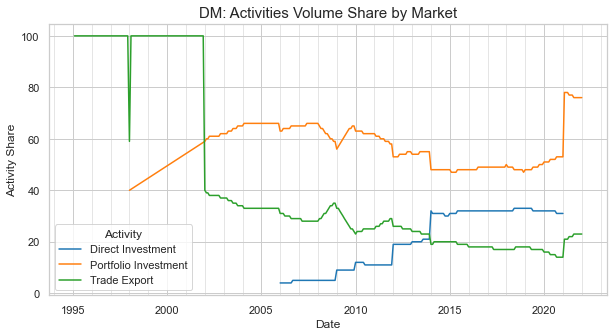

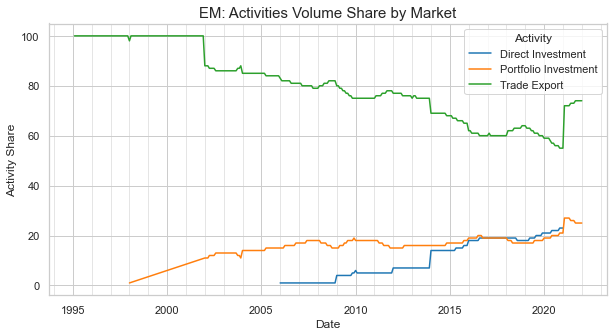

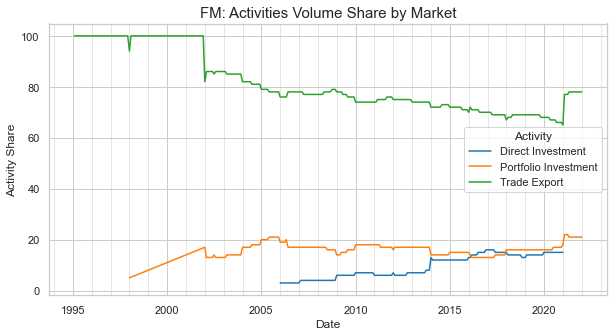

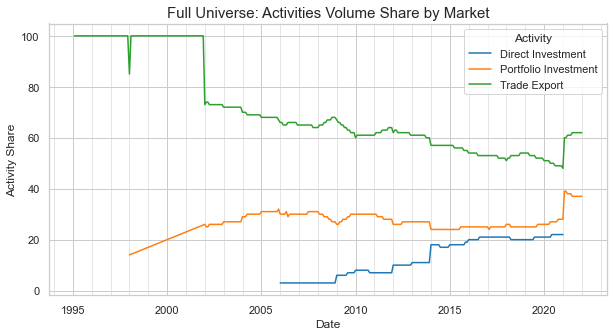

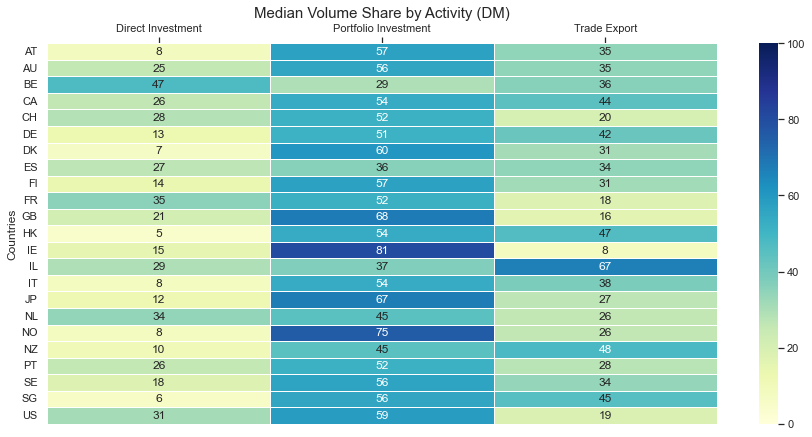

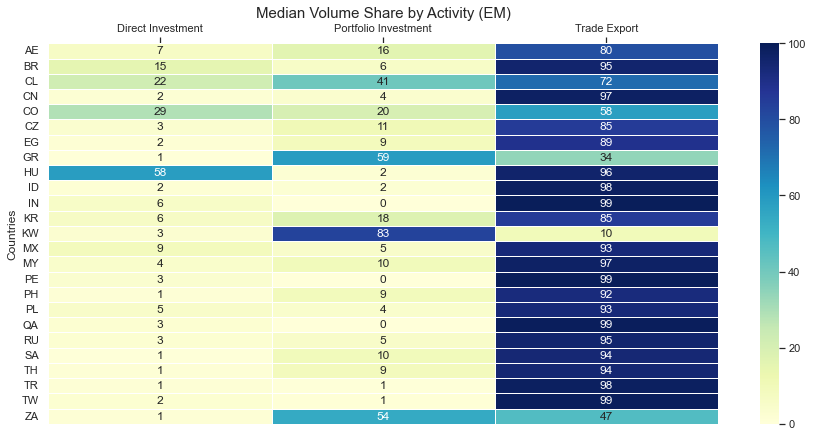

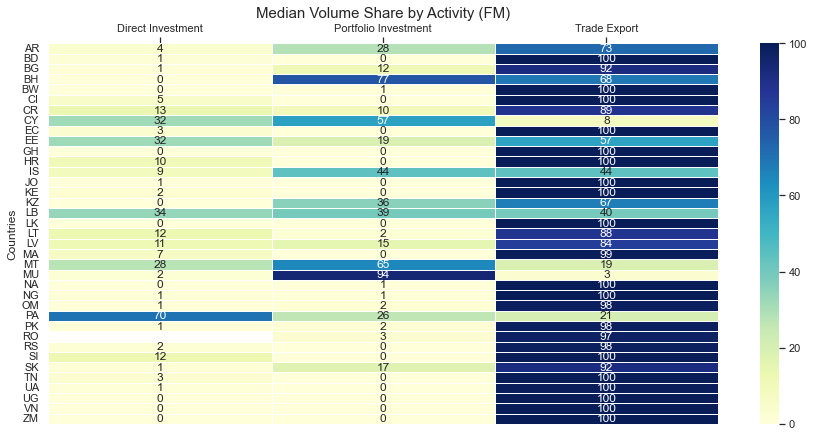

In [99]:
### RUN TO TEST: ACTIVITY SHARE ILLUSTRATING:

### Data loading:
ser_country_sum = pd.read_hdf(str_path_gravity_results, key = str_key_activity_share)
ser_sum_isoned = ser_country_sum.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
ser_country_share = pd.read_hdf(str_path_gravity_results, key = str_key_activity_share)
ser_share_isoned = ser_country_share.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
ser_country_median = (ser_share_isoned.groupby(['Activity', 'Reporter', 'Market']).median() * 100)
### By Market Shares:
ser_market_sum = ser_sum_isoned.loc[list(dict_country_sum.keys())[:-2], :].groupby(['Date', 'Market', 'Activity']).sum()
ser_market_share = ser_market_sum / ser_market_sum.groupby(['Date', 'Market']).sum()
ser_ison_share = ser_market_sum.groupby(['Date', 'Activity']).sum() / ser_market_sum.groupby(['Date']).sum()
### Market shares plotting:
for iter_market in list_regions + ['Full Universe']:
    ### General plotiing options:
    sns.set_style('whitegrid')
    sns.set_context('notebook')
    plt.figure(figsize = (10, 5))
    ### Line plot:
    if iter_market in list_regions:
        ser_iter_market = (ser_market_share.loc[date_ison : str_date_end, iter_market] * 100).fillna(0.0).astype(int).replace(0.0, np.NaN)
    else:
        ser_iter_market = (ser_ison_share.loc[date_ison : str_date_end] * 100).fillna(0.0).astype(int).replace(0.0, np.NaN)
    df_to_plot = ser_iter_market.reset_index()
    df_to_plot['Activity'] = df_to_plot['Activity'].replace(dict_activity)
    df_to_plot.sort_values(['Activity', 'Date'], inplace = True)
    ax_market_share = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Volume', hue = 'Activity')
    ax_market_share.set_title(iter_market + ': Activities Volume Share by Market', fontsize = 15)
    ax_market_share.set(ylabel = 'Activity Share')
    ### Major ticker options:    
    ax_market_share.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
    ax_market_share.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
    ### Minor ticker options:        
    ax_market_share.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
    ax_market_share.grid(visible = True, which = 'minor', linewidth = 0.5) 
    ### Plot drawing:
    plt.show()   
### Country shares plotting:
for iter_region in list_regions:  
    ### General plotiing options:
    sns.set_style('whitegrid')
    sns.set_context('notebook')
    plt.figure(figsize = (15, 7))
    ser_iter_country = ser_country_median.loc[:, :, iter_region]
    ser_iter_country = ser_iter_country.reset_index('Activity').replace(dict_activity).set_index('Activity', append = True).squeeze()
    df_to_plot = ser_iter_country.unstack('Activity').sort_index(axis = 1)
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                vmin = 0, vmax = 100, center = 50, fmt = '.0f')
    ### Plot formatting:
    ax_heatmap.xaxis.set_ticks_position('top')
    ax_heatmap.set(xlabel = '', ylabel = 'Countries')
    ax_heatmap.set_title('Median Volume Share by Activity (' + iter_region + ')', fontsize = 15)
    plt.yticks(rotation = 0)
    ### Plot drawing:
    plt.show()  

Data_Files/Source_Files/herfindahl indices.h5 File removed


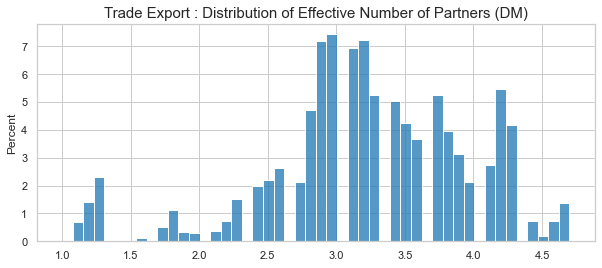

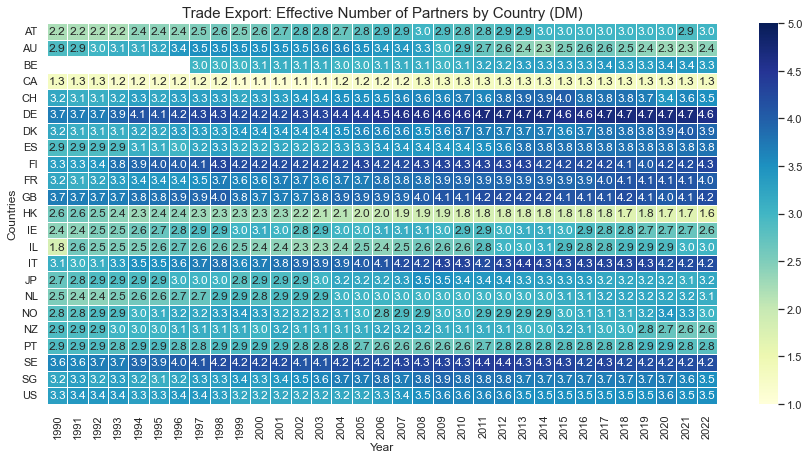

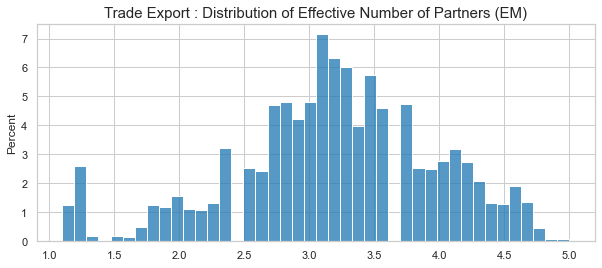

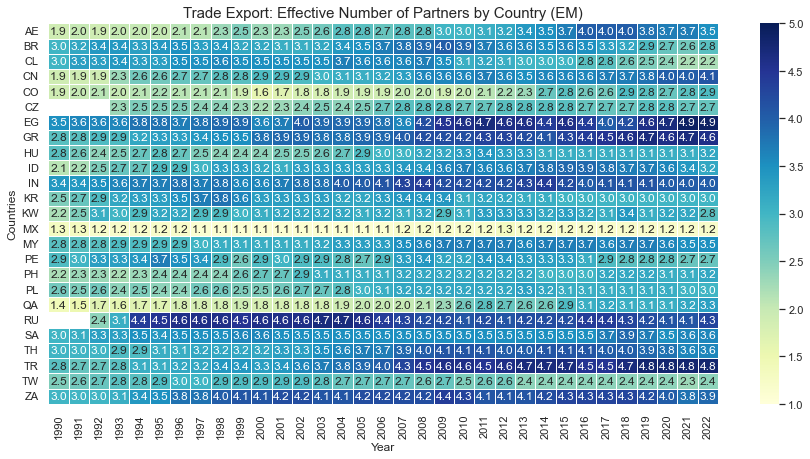

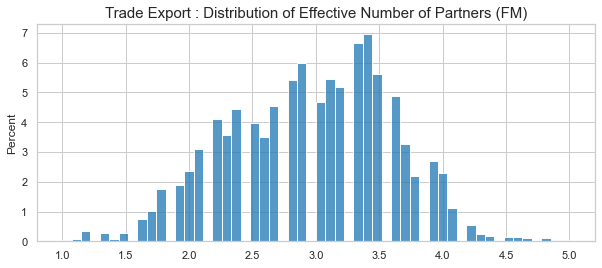

...

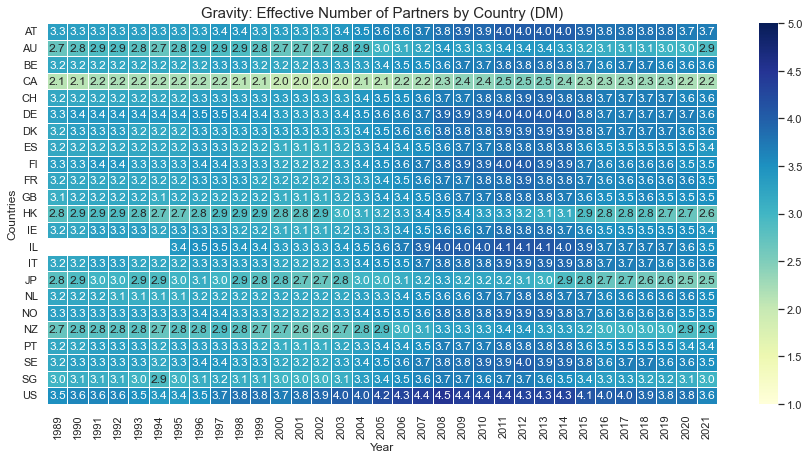

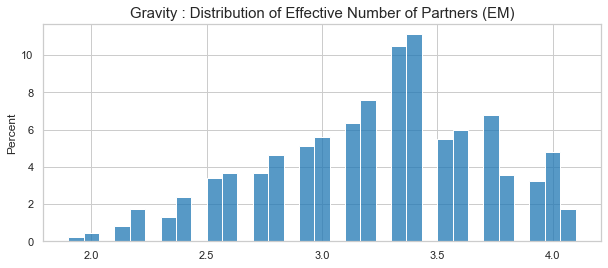

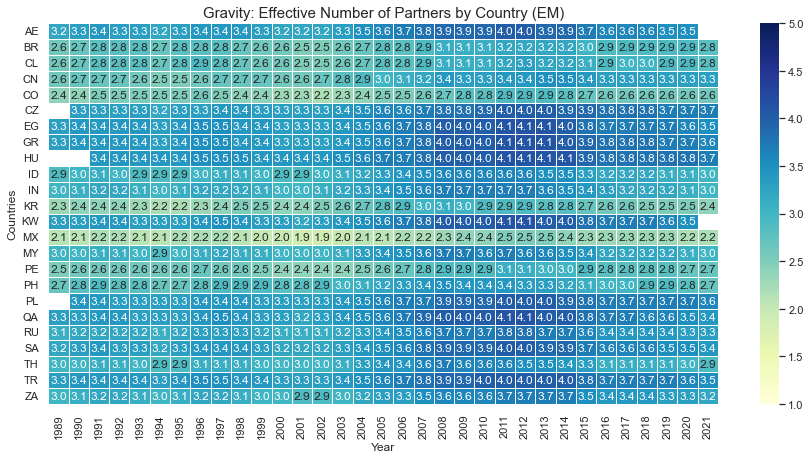

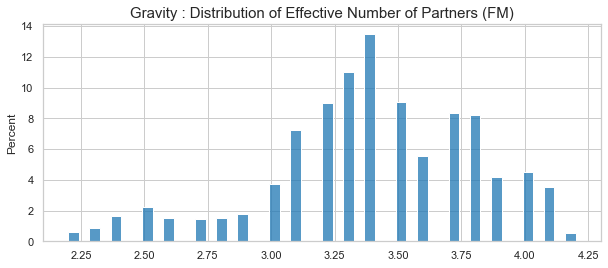

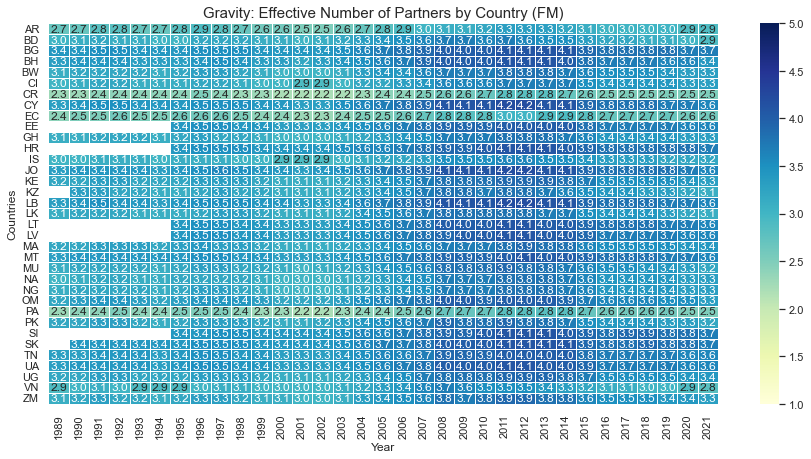

In [13]:
### RUN EVERY TIME: HERFINDAHL INDEX CALСULATION

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'gravity')

### Defining Herfindahl index calculation:
def get_herfindahl(ser_group):
    if (ser_group.count() > 0):
        ser_norm = ser_group / ser_group.sum()
        flo_herfindahl = 1 / ((ser_norm ** 2).sum() ** (1 / 2))
    else:
        flo_herfindahl = np.NaN
    return flo_herfindahl
### Deleting existing file with annualized data:
if os.path.exists(str_path_herfindahl):
    os.remove(str_path_herfindahl)
    print(str_path_herfindahl, 'File removed')
### Looping over activities datasets:
for iter_dataset in dict_annual:
#for iter_dataset in ['imf_cpis']:    
    ### Herfindahl index calculation:
    ser_herfindahl_full = dict_annual[iter_dataset].groupby(['Date', 'Reporter']).apply(get_herfindahl)
    ser_herfindahl_full.to_hdf(str_path_herfindahl, iter_dataset, mode = 'a', format = 'table')
    ser_herfindahl_mean = ser_herfindahl_full.unstack('Reporter').resample('BY').mean().stack('Reporter').sort_index()
    ### HI values preparation to plot:
    ser_isoned_full = ser_herfindahl_full.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze().round(1)
    ser_isoned_full.name = 'Herfindahl'
    ser_isoned_mean = ser_herfindahl_mean.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze().round(1)
    ### Looping over regions:
    for iter_region in list_regions:
#    for iter_region in ['EM']:
        ### Distribution plotting:
        sns.set_style('whitegrid')
        sns.set_context('notebook')
        plt.figure(figsize = (10, 4))
        ax_herfindahl = sns.histplot(ser_isoned_full.loc[:, :, iter_region].values, kde = False, stat = 'percent')
        ax_herfindahl.set_title(dict_activity[iter_dataset] + ' : Distribution of Effective Number of Partners (' + iter_region + ')', fontsize = 15)
        plt.show()
        ### Dataset formatting:
        df_to_plot = ser_isoned_mean.loc[:, :, iter_region].reset_index()
        df_to_plot['Year'] = df_to_plot['Date'].dt.year
        df_to_plot = df_to_plot.drop(['Date'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
        ### Results plotting:
        plt.figure(figsize = (15, 7))
        ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                 vmin = 1.0, vmax = 5.0, fmt = '.1f')
        ### Plot formatting:
        ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
        ax_heatmap.set_title(dict_activity[iter_dataset] + ': Effective Number of Partners by Country (' + iter_region + ')', fontsize = 15)
        plt.yticks(rotation = 0)
        plt.show()  
#        break
#    break     

In [49]:
### TEMP

dict_herfindahl = {}
for iter_activity in dict_activity:
    ser_iter_herfindahl = pd.read_hdf(str_path_herfindahl, iter_activity)
    df_iter_herfindahl = ser_iter_herfindahl.reset_index('Reporter')
    df_iter_herfindahl['Country'] = df_iter_herfindahl['Reporter'].astype(str)
    dict_herfindahl[iter_activity] = df_iter_herfindahl.drop('Reporter', axis = 1).set_index('Country', append = True).squeeze()
ser_full_herfindahl = pd.concat(dict_herfindahl, axis = 0).reorder_levels([1, 2, 0])
ser_full_herfindahl.index.names = ['Date', 'Country', 'Activity']
ser_full_herfindahl.to_hdf(str_path_gravity_results, str_key_herfindahl, mode = 'a')

In [16]:
### RUN EVERY TIME: REPLACING VALUES WITH WEIGHTS WHILE CONTROLLING HERFINDAL INDEX VALUE

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'gravity')
### Weights container:
dict_weights = {}
### Defining Herfindahl index calculation:
def set_weights(ser_group, flo_limit = 1.0):
    if (ser_group.count() > 0):
        ser_norm = ser_group / ser_group.sum()
        flo_herfindahl = 1 / ((ser_norm ** 2).sum() ** (1 / 2))
        if (flo_herfindahl < flo_limit):
            ser_weights = pd.Series(np.NaN, index = ser_group.index)
        else:
            ser_weights = ser_norm
    else:
        ser_weights = ser_group
    return ser_weights
### Deleting existing file with weights:
if os.path.exists(str_path_act_weights):
    os.remove(str_path_act_weights)
    print(str_path_act_weights, 'File removed')
### Looping over activities datasets:
for iter_dataset in dict_annual:
#for iter_dataset in ['imf_cpis']:    
    ### Weights calculation:
    gc.collect()
    print(iter_dataset, ': weights calculation started')    
    ser_iter_weights = dict_annual[iter_dataset].groupby(['Date', 'Reporter']).apply(set_weights, flo_hi_threshold)
    ser_iter_weights.to_hdf(str_path_act_weights, iter_dataset, mode = 'a', format = 'table')
    print(iter_dataset, ': weights calculation done')
#    break

Data_Files/Source_Files/datasets_weights.h5 File removed
imf_dots : weights calculation started
imf_dots : weights calculation done
imf_cpis : weights calculation started
imf_cpis : weights calculation done
oecd_fdi : weights calculation started
oecd_fdi : weights calculation done
bis_lbs : weights calculation started
bis_lbs : weights calculation done
gravity : weights calculation started
gravity : weights calculation done


In [ ]:
### TEST: EFFECT OF FILTERING WEIGHTS

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'gravity')

### Defining Herfindahl index calculation:
def get_herfindahl(ser_group):
    if (ser_group.count() > 0):
        ser_norm = ser_group / ser_group.sum()
        flo_herfindahl = 1 / ((ser_norm ** 2).sum() ** (1 / 2))
    else:
        flo_herfindahl = np.NaN
    return flo_herfindahl

### Looping over activities datasets:
for iter_dataset in dict_annual:
#for iter_dataset in ['imf_cpis']:    
    ### Herfindahl index calculation:
    ser_herfindahl_full = dict_annual[iter_dataset].groupby(['Date', 'Reporter']).apply(get_herfindahl)
    ser_herfindahl_mean = ser_herfindahl_full.unstack('Reporter').resample('BY').mean().stack('Reporter').sort_index()
    ### HI values preparation to plot:
    ser_isoned_full = ser_herfindahl_full.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze().round(1)
    ser_isoned_full.name = 'Herfindahl'
    ser_isoned_mean = ser_herfindahl_mean.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze().round(1)
    ### Looping over regions:
    for iter_region in list_regions:
#    for iter_region in ['EM']:
        ### Distribution plotting:
        sns.set_style('whitegrid')
        sns.set_context('notebook')
        plt.figure(figsize = (10, 4))
        ax_herfindahl = sns.histplot(ser_isoned_full.loc[:, :, iter_region].values, kde = False, stat = 'percent')
        ax_herfindahl.set_title(iter_dataset + ' : Herfindahl index distribution (' + iter_region + ')', fontsize = 15)
        plt.show()
        ### Dataset formatting:
        df_to_plot = ser_isoned_mean.loc[:, :, iter_region].reset_index()
        df_to_plot['Year'] = df_to_plot['Date'].dt.year
        df_to_plot = df_to_plot.drop(['Date'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
        ### Results plotting:
        plt.figure(figsize = (15, 7))
        ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                 vmin = 1.0, vmax = 5.0, fmt = '.1f')
        ### Plot formatting:
        ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
        ax_heatmap.set_title(iter_dataset + ': Herfindahl index distribution (' + iter_region + ')', fontsize = 15)
        plt.yticks(rotation = 0)
        plt.show()  
#        break
#    break     

In [94]:
### TEST: CORRELATIONS WITH IMF DOTS CALCULATION

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'oecd_fdi')
#dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'gravity')
### Annualized data aggregation:
df_annual = pd.concat(dict_annual, axis = 1)
df_annual = df_annual.reindex(df_annual.index.dropna()).sort_index()
### Annualized data correlation calculating:
df_ann_corr = df_annual.fillna(0).groupby(['Date', 'Reporter']).corr().loc[(All, All, 'imf_dots'), :].droplevel(-1)

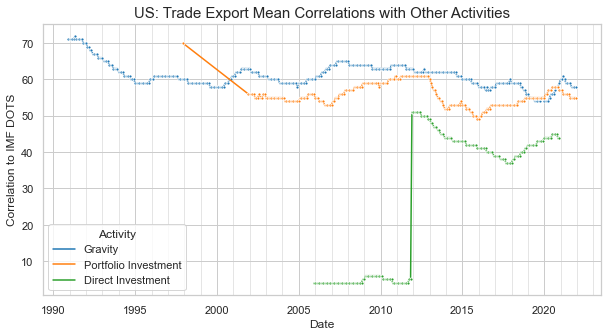

In [95]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (US)

### Example preparation to plot:
str_country = 'US' # 'IL'
df_country_test = df_ann_corr.loc[(All, str_country), :].droplevel('Reporter').drop('imf_dots', axis = 1)
df_country_test = df_country_test.resample('MS').last()
df_country_test = df_country_test.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_country_test.columns = df_country_test.columns.ravel(1)
ser_country_test = df_country_test.stack()
ser_country_test.index.names = ['Date', 'Activity']
ser_country_test.name = 'Correlation to IMF DOTS'
ser_country_test = (ser_country_test * 100).astype(int)
df_to_plot = ser_country_test.reset_index()
### General plotting options:
sns.set_style('whitegrid')
plt.figure(figsize = (10, 5))
sns.set_context('notebook')
### Line plot:
ax_corr = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Correlation to IMF DOTS', hue = 'Activity', marker = 'o', markersize = 3)
ax_corr.set_title(str_country + ': Trade Export Mean Correlations with Other Activities', fontsize = 15)
#ax_partners.set(xlim = (date_start, date_end), ylim = (20, 105), ylabel = 'Countries')
### Major ticker options:    
ax_corr.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
ax_corr.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
### Minor ticker options:        
ax_corr.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
ax_corr.grid(visible = True, which = 'minor', linewidth = 0.5) 
### Plot drawing:
plt.show()

In [51]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (US)

gc.collect()

df_test_ann = df_annual.loc[(All, 'US', All), :].droplevel('Reporter')
df_test_corr = df_test_ann.fillna(0).groupby('Date').corr().loc[(All, 'imf_dots'), :].droplevel(-1).drop('imf_dots', axis = 1)
df_test_corr = df_test_corr.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_test_corr.columns = df_test_corr.columns.ravel(1)
display(df_test_corr.loc['2011-11-30' : '2011-12-30'])
print('Direct Investment Observations Number on 2011-11-30:', df_annual.loc[('2011-11-30', 'US', All), 'oecd_fdi'].droplevel('Reporter').count())
print('Direct Investment Observations Number on 2011-12-30:', df_annual.loc[('2011-12-30', 'US', All), 'oecd_fdi'].droplevel('Reporter').count())

,Bank Lending,Direct Investment,Gravity,Portfolio Investment
Date,,,,
2011-11-30,0.278725,0.050248,0.634134,0.614102
2011-12-30,0.279708,0.517748,0.631143,0.615542


Direct Investment Observations Number on 2011-11-30: 11
Direct Investment Observations Number on 2011-12-30: 78


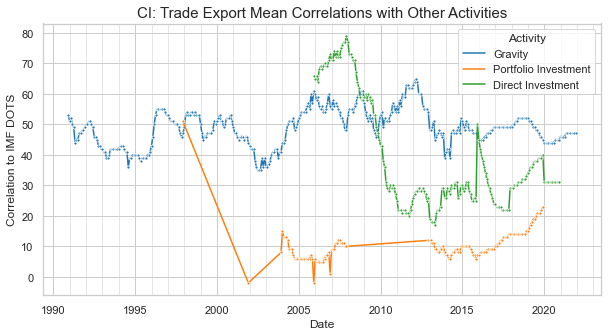

In [96]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (CI)

### Example preparation to plot:
str_country = 'CI' # 'IL'
df_country_test = df_ann_corr.loc[(All, str_country), :].droplevel('Reporter').drop('imf_dots', axis = 1)
df_country_test = df_country_test.resample('MS').last()
df_country_test = df_country_test.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_country_test.columns = df_country_test.columns.ravel(1)
ser_country_test = df_country_test.stack()
ser_country_test.index.names = ['Date', 'Activity']
ser_country_test.name = 'Correlation to IMF DOTS'
ser_country_test = (ser_country_test * 100).astype(int)
df_to_plot = ser_country_test.reset_index()
### General plotiing options:
sns.set_style('whitegrid')
plt.figure(figsize = (10, 5))
sns.set_context('notebook')
### Line plot:
ax_corr = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Correlation to IMF DOTS', hue = 'Activity', marker = 'o', markersize = 3)
ax_corr.set_title(str_country + ': Trade Export Mean Correlations with Other Activities', fontsize = 15)
### Major ticker options:    
ax_corr.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
ax_corr.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
### Minor ticker options:        
ax_corr.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
ax_corr.grid(visible = True, which = 'minor', linewidth = 0.5) 
### Plot drawing:
plt.show()

In [73]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (CI)

gc.collect()

df_test_ann = df_annual.loc[(All, 'CI', All), :].droplevel('Reporter').sort_index()
df_test_corr = df_test_ann.fillna(0).groupby('Date').corr().loc[(All, 'imf_dots'), :].droplevel(-1).drop('imf_dots', axis = 1)
df_test_corr = df_test_corr.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_test_corr.columns = df_test_corr.columns.ravel(1)
display(df_test_corr.loc['2015-11-30' : '2015-12-31'])
print('Direct Investment Observations Number on 2015-11-30:', df_annual.loc[('2015-11-30', 'CI', All), 'oecd_fdi'].droplevel('Reporter').count())
print('Direct Investment Observations Number on 2015-12-31:', df_annual.loc[('2015-12-31', 'CI', All), 'oecd_fdi'].droplevel('Reporter').count())
#df_annual.loc[(All, 'CI', All), 'oecd_fdi'].dropna().iloc[240 : 280]

,Bank Lending,Direct Investment,Gravity,Portfolio Investment
Date,,,,
2015-11-30,0.299866,0.259607,0.475544,0.064218
2015-12-31,0.312802,0.502346,0.465342,0.071562


Direct Investment Observations Number on 2015-11-30: 6
Direct Investment Observations Number on 2015-12-31: 11


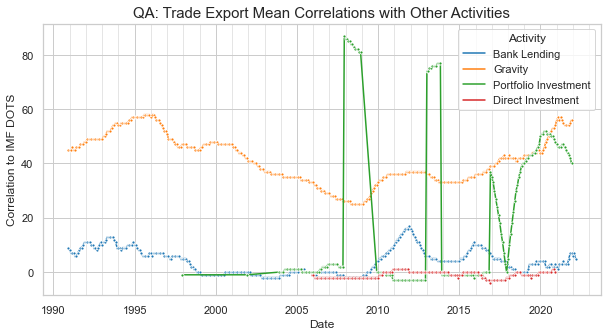

In [59]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (QA)

### Example preparation to plot:
str_country = 'QA' # 'IL'
df_country_test = df_ann_corr.loc[(All, str_country), :].droplevel('Reporter').drop('imf_dots', axis = 1)
df_country_test = df_country_test.resample('MS').last()
df_country_test = df_country_test.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_country_test.columns = df_country_test.columns.ravel(1)
ser_country_test = df_country_test.stack()
ser_country_test.index.names = ['Date', 'Activity']
ser_country_test.name = 'Correlation to IMF DOTS'
ser_country_test = (ser_country_test * 100).astype(int)
df_to_plot = ser_country_test.reset_index()
### General plotiing options:
sns.set_style('whitegrid')
plt.figure(figsize = (10, 5))
sns.set_context('notebook')
### Line plot:
ax_corr = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Correlation to IMF DOTS', hue = 'Activity', marker = 'o', markersize = 3)
ax_corr.set_title(str_country + ': Trade Export Mean Correlations with Other Activities', fontsize = 15)
### Major ticker options:    
ax_corr.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
ax_corr.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
### Minor ticker options:        
ax_corr.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
ax_corr.grid(visible = True, which = 'minor', linewidth = 0.5) 
### Plot drawing:
plt.show()

In [77]:
### TEST: CORRELATIONS WITH IMF DOTS VISUALIZATION (QA)

gc.collect()

df_test_ann = df_annual.loc[(All, 'QA', All), :].droplevel('Reporter')
df_test_corr = df_test_ann.fillna(0).groupby('Date').corr().loc[(All, 'imf_dots'), :].droplevel(-1).drop('imf_dots', axis = 1)
df_test_corr = df_test_corr.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_test_corr.columns = df_test_corr.columns.ravel(1)
display(df_test_corr.loc['2013-11-29' : '2013-12-31'])
print('Observations number on 2013-11-29:', df_annual.loc[('2013-11-29', 'QA', All), 'imf_cpis'].droplevel('Reporter').count())
print('Observations number on 2013-12-31:', df_annual.loc[('2013-12-31', 'QA', All), 'imf_cpis'].droplevel('Reporter').count())
display(df_annual.loc[(All, 'QA', All), 'imf_cpis'].dropna().iloc[173 : 178])

,Bank Lending,Direct Investment,Gravity,Portfolio Investment
Date,,,,
2013-11-29,0.046399,0.003988,0.335787,0.770420
2013-12-31,0.045256,-0.000906,0.332863,-0.011532


Observations number on 2013-11-29: 2
Observations number on 2013-12-31: 3


Date        Reporter  Partner
2013-11-29  QA        JP         0.777407
                      TH         0.222593
2013-12-31  QA        JP         0.002242
                      MY         0.997109
                      TH         0.000650
Name: imf_cpis, dtype: float32

DM stats:
         Direct Investment  Gravity  Portfolio Investment
min                   4.0     56.0                  24.0
max                  74.0     96.0                  98.0
median               48.0     76.0                  76.0


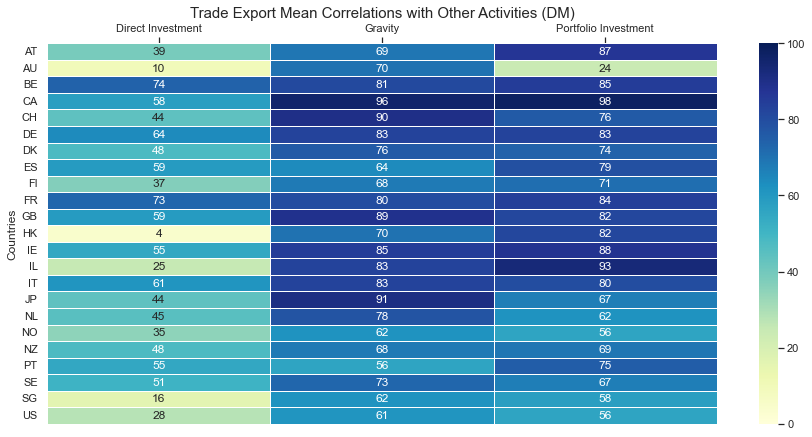

EM stats:
         Direct Investment  Gravity  Portfolio Investment
min                  -1.0      0.0                  14.0
max                  66.0     95.0                  94.0
median               21.0     74.0                  49.0


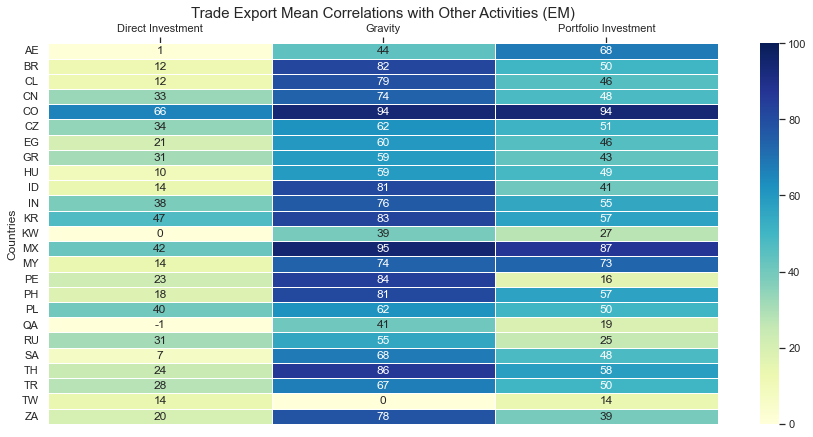

FM stats:
         Direct Investment  Gravity  Portfolio Investment
min                  -1.0      0.0                  -2.0
max                  81.0     94.0                  85.0
median               22.0     45.0                  14.0


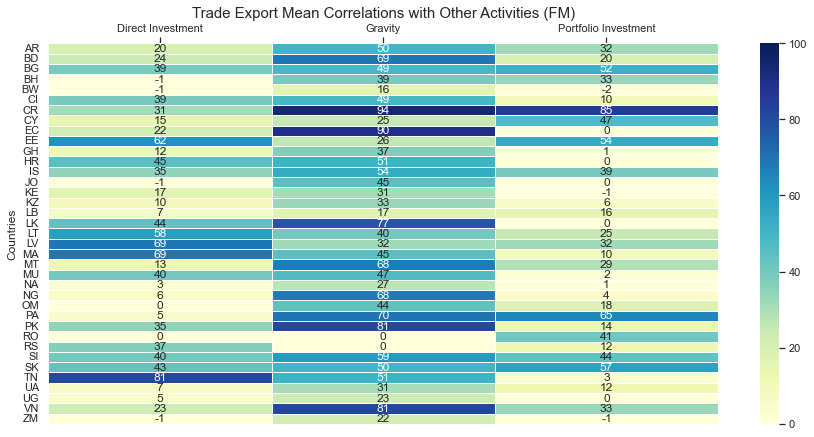

In [97]:
### TEST: CORRELATIONS WITH IMF DOTS AGGREGATION

### Mean correlations for each country:
df_mean_corr = (df_ann_corr.groupby('Reporter').mean() * 100).drop('imf_dots', axis = 1).fillna(0).astype('int16')
df_mean_corr = df_mean_corr.stack().reset_index(-1).replace(dict_activity).set_index('level_1', append = True).squeeze().unstack('level_1')
df_mean_corr.columns = df_mean_corr.columns.ravel(1)
### Data preparation to plotting:
ser_mean_corr = df_mean_corr.join(ser_ison_status).set_index('Market', append = True).stack()
ser_mean_corr.index.names = ['Country', 'Market', 'Activity']
ser_mean_corr.name = 'Mean correlation with DOTS'
### Looping over regions:
for iter_region in list_regions:
    ### Dataset formatting:
    df_to_plot = ser_mean_corr.loc[:, iter_region, :].unstack('Activity')
    print(iter_region, 'stats:\n', df_to_plot.agg([min, max, np.median]))
    ### Results plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                vmin = 0, vmax = 100, center = 50)
    ### Plot formatting:
    ax_heatmap.xaxis.set_ticks_position('top')
    ax_heatmap.set(xlabel = '', ylabel = 'Countries')
    ax_heatmap.set_title('Trade Export Mean Correlations with Other Activities (' + iter_region + ')', fontsize = 15)
    plt.yticks(rotation = 0)
    ### Plot drawing:
    plt.show()  

In [86]:
### TEST: AUTOCORRELATIONS

str_dataset = 'oecd_fdi'
str_country = 'FI'
ser_test = df_annual[str_dataset][:, str_country, :]
ser_current = ser_test.fillna(0)
ser_shifted = ser_current.groupby(['Partner']).shift(36).fillna(0)
df_to_auto = pd.concat([ser_current, ser_shifted], axis = 1, sort = False)
df_to_auto.columns = ['Current', 'Shifted']
df_to_auto[(df_to_auto['Current'] > 0.0) & (df_to_auto['Shifted'] > 0.0)]
#display(df_to_auto.groupby('Date').corr().loc[(All, 'Current'), 'Shifted'].dropna()[0 : 30])
df_test = ser_test.loc[pd.date_range('2007-01-01', '2014-01-01', freq = 'BY')].unstack('Date')
print(df_test.count())
display(df_test[df_test.columns[: -1]].dropna(how = 'all'))

Date
2007-12-31     6
2008-12-31     8
2009-12-31     9
2010-12-31     9
2011-12-30    11
2012-12-31    13
2013-12-31    62
dtype: int64


Date,2007-12-31,2008-12-31,2009-12-31,2010-12-31,2011-12-30,2012-12-31
Partner,,,,,,
AU,NaN,NaN,NaN,NaN,NaN,0.002485
BE,NaN,0.720469,0.720190,0.736094,0.627927,0.394428
CA,NaN,NaN,NaN,NaN,0.037146,0.066960
CO,0.000066,0.000020,0.000019,0.000019,0.000017,0.000025
EE,0.457506,0.102049,0.099502,0.101104,0.094547,0.158882
FR,0.370983,0.105755,0.110719,0.099194,0.069077,0.097840
HU,NaN,0.029970,0.035268,0.033250,0.008401,0.010363
IE,NaN,NaN,NaN,NaN,NaN,0.011007
LT,0.089769,0.022174,0.020919,0.016511,0.016669,0.022895


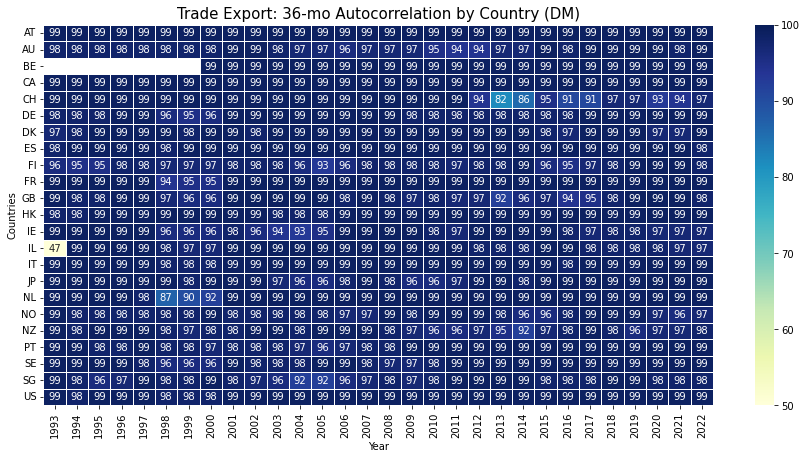

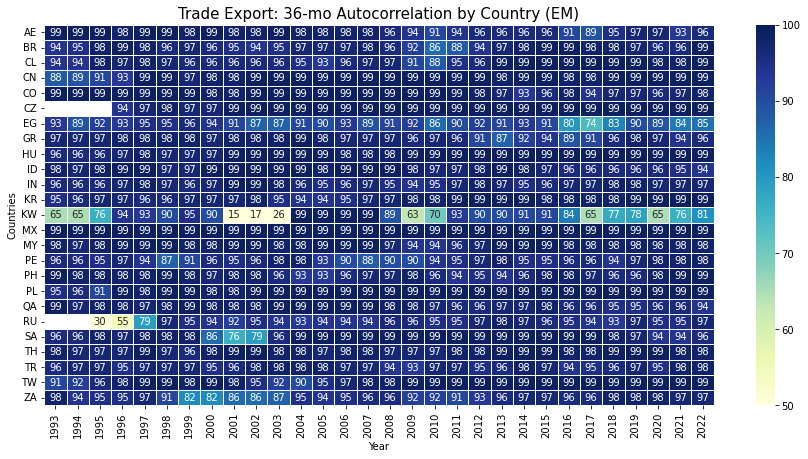

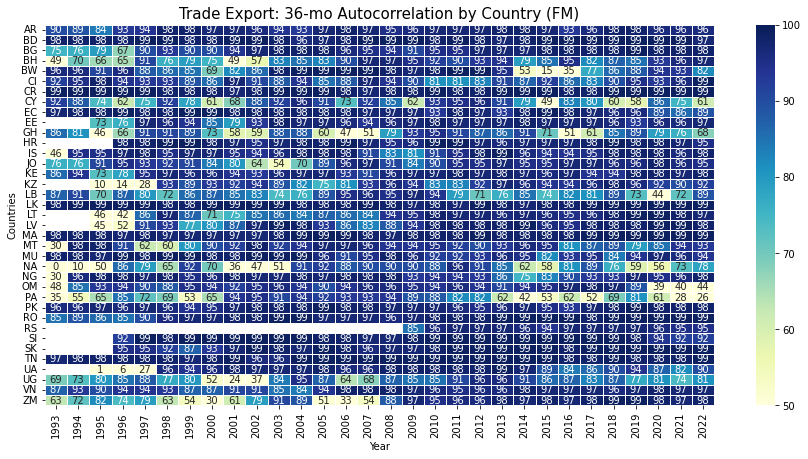

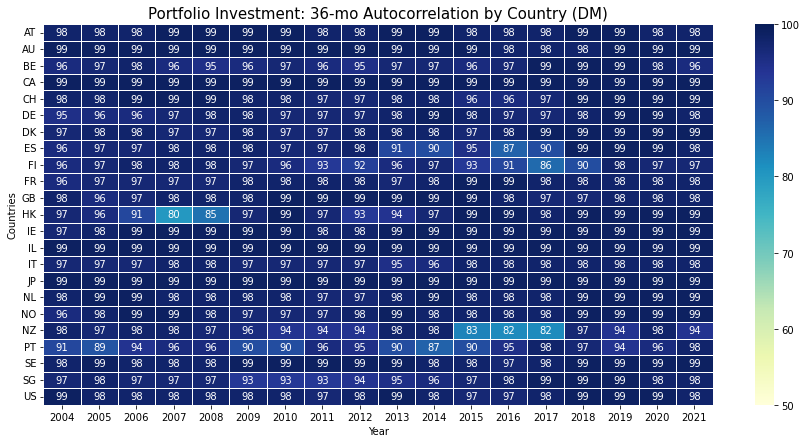

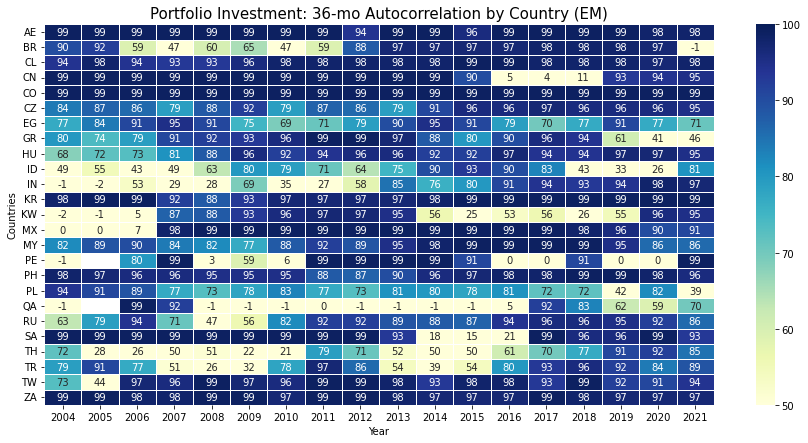

...

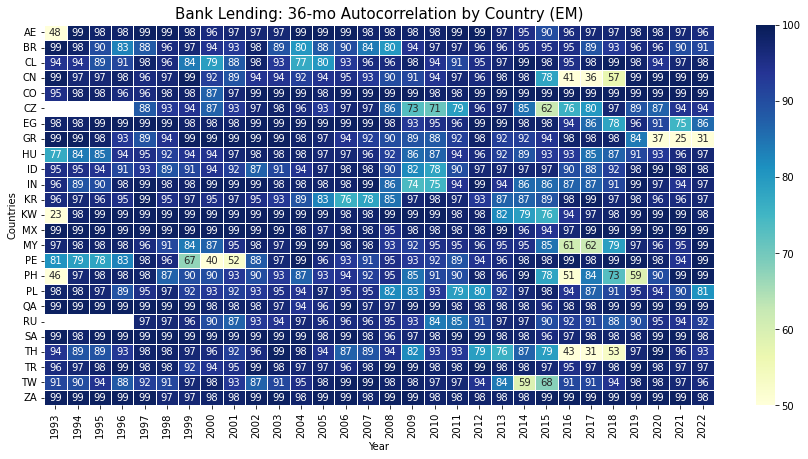

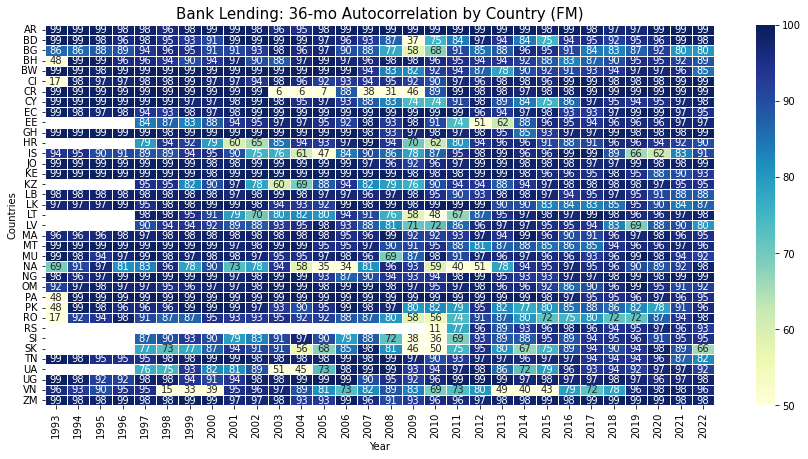

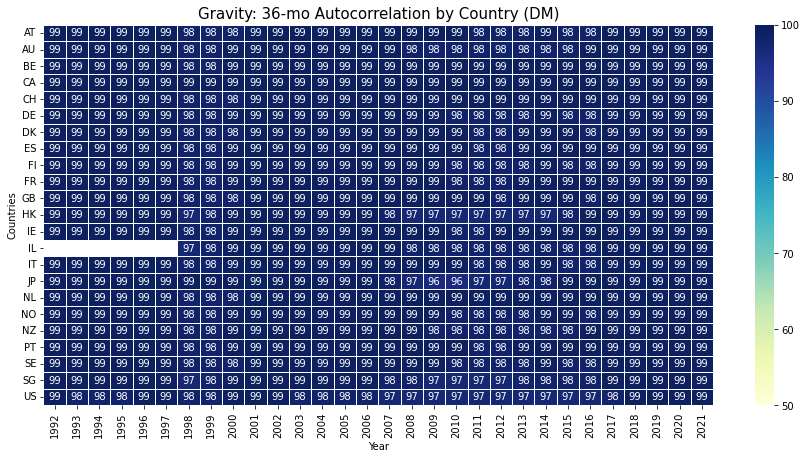

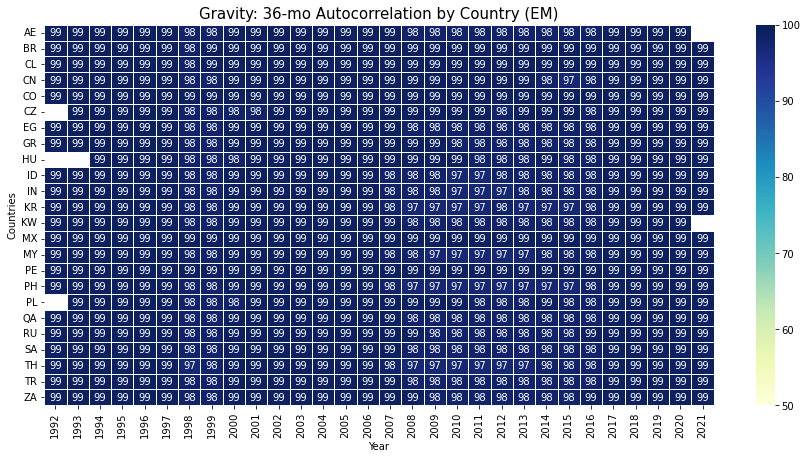

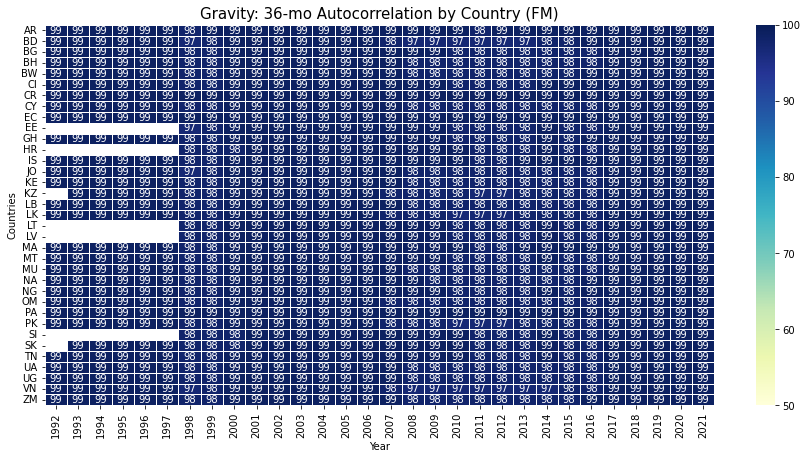

In [12]:
### TEST: AUTOCORRELATIONS

gc.collect()
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_weights, key = 'gravity')
### Annualized data aggregation:
df_annual = pd.concat(dict_annual, axis = 1)
df_annual = df_annual.reindex(df_annual.index.dropna()).sort_index()
### Looping over activities:
for iter_dataset in df_annual.columns:
#for iter_dataset in ['imf_cpis']:    
    gc.collect()
    ### Autocorrelation performing:    
    ser_current = df_annual[iter_dataset].fillna(0)
    ser_shifted = ser_current.groupby(['Reporter', 'Partner']).shift(36).fillna(0)
    df_to_auto = pd.concat([ser_current, ser_shifted], axis = 1, sort = False)
    df_to_auto.columns = ['Current', 'Shifted']
    df_autocorr = df_to_auto.groupby(['Date', 'Reporter']).corr()
    ser_autocorr = df_autocorr['Current'][:, :, 'Shifted']
    ### Annual mean of autocorrelations:
    ser_auto_mean = (ser_autocorr.unstack('Reporter').resample('BY').mean().stack('Reporter').sort_index() * 100).fillna(0).astype(int)
    ser_auto_mean = ser_auto_mean.to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()    
    ### Looping over regions to illustrate:
    for iter_region in list_regions:
#    for iter_region in ['FM']:        
        ### Dataset formatting:
        df_to_plot = ser_auto_mean.loc[:, :, iter_region].reset_index()
        df_to_plot['Year'] = df_to_plot['Date'].dt.year
        df_to_plot = df_to_plot.drop(['Date'], axis = 1).set_index(['Reporter', 'Year']).squeeze().unstack('Year').sort_index()
        ### Results plotting:
        plt.figure(figsize = (15, 7))
        ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True,
                                 vmin = 50, vmax = 100, fmt = '.3g')
        ### Plot formatting:
        ax_heatmap.set(xlabel = 'Year', ylabel = 'Countries')
        ax_heatmap.set_title(dict_activity[iter_dataset] + ': 36-mo Autocorrelation by Country (' + iter_region + ')', fontsize = 15)
        plt.yticks(rotation = 0)
        plt.show()   

In [47]:
### RUN EVERY TIME: WEGHTED AVERAGE OF RETURNS CALCULATION

gc.collect()
### Lags initialization:
dict_lag = {}
dict_lag['imf_dots'] = 3
dict_lag['imf_cpis'] = 6
dict_lag['oecd_fdi'] = 24
dict_lag['bis_lbs'] = 6
dict_lag['gravity'] = 9
### Periods to fill initialization:
dict_ffill = {}
dict_ffill['imf_dots'] = 1
dict_ffill['imf_cpis'] = 12
dict_ffill['oecd_fdi'] = 12
dict_ffill['bis_lbs'] = 3
dict_ffill['gravity'] = 12
### Annualized data loading:
dict_annual = {}
dict_annual['imf_dots'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_dots')
dict_annual['imf_cpis'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'imf_cpis')
dict_annual['oecd_fdi'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'oecd_fdi')
dict_annual['bis_lbs'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'bis_lbs')
dict_annual['gravity'] = pd.read_hdf(path_or_buf = str_path_act_annualized, key = 'gravity')
### Returns defining & shifting:
ser_ret_usd = pd.read_hdf(str_path_bb_hdf, str_key_ret_daily).loc['USD']

ser_ret_shifted = ser_ret_usd.groupby('Country').shift()
ser_ret_shifted.index.names = ['Date', 'Partner']
ser_ret_shifted.name = 'ret_usd'

In [ ]:
### TEMP

#ser_ret_usd = pd.read_hdf(str_path_bb_hdf, str_key_ret_daily).loc['USD']
#ser_ret_usd.loc[:, 'PA'][: 15]
ser_ret_usd.loc['2020-08-12', 'ZA'] = np.NaN
ser_ret_usd.loc['2020-08-20', 'ZA'] = np.NaN
print(ser_ret_usd[:, 'ZA'][-15 :])
ser_ret_cal = ser_ret_usd.groupby('Country').apply(lambda ser_country: ser_country.droplevel('Country').resample('D').asfreq()).fillna(0.0).swaplevel()
print(ser_ret_cal[:, 'ZA'][-15 :])

In [29]:
### TEMP

list_weight = list(map(lambda iter_num: exp_weight_single(int_halflife_months * 22, iter_num), range(int_ave_months * 22)))[::-1]
len(list_weight)

132

In [48]:
### RUN EVERY TIME: WEGHTED AVERAGE OF RETURNS CALCULATION

### Weighted mean for end-of-bmonth dates defining:
def get_weighted_mean(ser_group):
    ser_values = ser_group.droplevel('Partner')
    if (ser_values.index[-1] == ser_values.index[-1] + pd.offsets.BMonthEnd(0)):
        ser_weights = pd.Series(list_weight[-len(ser_values.index) : ], ser_values.index)
        flo_result = weighted_average(ser_values, ser_weights)
    else:
        flo_result = np.NaN
    return flo_result
### Weights defining:
list_weight = list(map(lambda iter_num: exp_weight_single(int_halflife_months * 22, iter_num), range(int_ave_months * 22)))[::-1]
### Mean returns calculation:
#ser_test = ser_ret_shifted.loc[:, ['US', 'IL']]#[-132 : ]
ser_ret_ave = ser_ret_shifted.groupby('Partner', group_keys = False)\
                             .rolling(window = int_ave_months * 22, min_periods = int_ave_months * 22 // 2)\
                             .apply(get_weighted_mean, raw = False).dropna()

In [76]:
### RUN EVERY TIME: WEGHTED AVERAGE OF RETURNS CALCULATION

gc.collect()
### Weighted returns calculator:
def get_weighted_ret(df_group):
    df_group = df_group.dropna()
    flo_weighted = np.NaN
    if (len(df_group.index) > 0):
        flo_weighted = (df_group['Weight'] * df_group['Ret_USD']).sum()
    return flo_weighted
### Global container:
dict_all_weighted = {}
### Number of datasets active:
int_len = -1
### Looping over returns dates:
for iter_date in sorted(ser_ret_ave.dropna().index.get_level_values('Date').unique()):
#for iter_date in [pd.to_datetime('1990-04-30')]:
    ### Dates defining:
    date_bm_end = iter_date + pd.offsets.BMonthEnd(0)
    if (date_bm_end > iter_date):
        date_bm_end = date_bm_end - pd.offsets.BMonthEnd(1)
#    print(iter_date, '/', date_bm_end)
    ### Daily returns extraction:
    ser_iter_ret = ser_ret_ave.loc[iter_date]
    ### Daily container:
    dict_iter_weighted = {}
    for iter_dataset in dict_dataset:
#    for iter_dataset in ['imf_dots']:
        ### Loading raw dataset:
        ser_iter_raw = dict_dataset[iter_dataset].loc[: (date_bm_end - pd.offsets.BMonthEnd(dict_lag[iter_dataset]))]
        if (ser_iter_raw.count() > 0):
            ### Defining last date by lagging original dataset:
            date_last = ser_iter_raw.index.get_level_values('Date')[-1]
            date_prev = date_last - pd.offsets.BMonthEnd(dict_ffill[iter_dataset])
    #        print(iter_date, '/', date_bm_end, '/', date_prev, ':', date_last)
            ### Perform lagging & forward filling on annualized dataset:
            ser_iter_ann = dict_annual[iter_dataset].loc[date_prev : date_last].groupby(['Reporter', 'Partner']).ffill(limit = dict_ffill[iter_dataset])
            ### Taking last date value:
            ser_iter_last = ser_iter_ann[date_last]
            ### Calculating of weighted average of returns:
            df_to_weight = ser_iter_last.to_frame().join(ser_iter_ret)
            df_to_weight.columns = ['Weight', 'Ret_USD']
            df_to_weight['Weight'] = df_to_weight['Weight'].groupby('Reporter').apply(lambda ser_group: ser_group / ser_group.sum())
            ### Resulsts saving:
#            dict_iter_weighted[iter_dataset] = df_to_weight.groupby('Reporter').apply(lambda df_group: (df_group['Weight'] * df_group['Ret_USD']).sum())
            dict_iter_weighted[iter_dataset] = df_to_weight.groupby('Reporter').apply(get_weighted_ret)            
    if (len(dict_iter_weighted) > 0):
        ### Daily results aggregation:
        dict_all_weighted[iter_date] = pd.concat(dict_iter_weighted, axis = 1, sort = False)
    if (int_len != len(dict_iter_weighted)):
        int_len = len(dict_iter_weighted)
        print(iter_date, ':', str(int_len))
### Global results aggregation:
df_all_weighted = pd.concat(dict_all_weighted, axis = 0, sort = False) 
df_all_weighted.index.names = ['Date', 'Country']
### Global results saving:
df_all_weighted.to_hdf(str_path_ret_weighted, str_key_weighted, mode = 'w', format = 'table')

1990-04-30 00:00:00 : 1
1990-09-28 00:00:00 : 3
1998-06-30 00:00:00 : 4
2007-12-31 00:00:00 : 5


In [95]:
### TEST: RESULTS CORRELATIONS

df_all_weighted = pd.read_hdf(str_path_ret_weighted, str_key_weighted)
df_ret_corr = df_all_weighted.groupby('Date').corr()
df_ret_corr.index.names = ['Date', 'Activity']
df_ret_corr = df_ret_corr.stack().reset_index(-1).replace(dict_activity).set_index('level_2', append = True).squeeze().unstack('level_2')
df_ret_corr.columns = df_ret_corr.columns.ravel(1)
df_ret_corr = df_ret_corr.reset_index(-1).replace(dict_activity).set_index('Activity', append = True)
display(df_ret_corr.groupby('Activity').mean())

,Bank Lending,Direct Investment,Gravity,Portfolio Investment,Trade Export
Activity,,,,,
Bank Lending,1.000000,0.123059,0.277223,0.181568,0.318565
Direct Investment,0.123059,1.000000,0.092413,0.096446,0.199164
Gravity,0.277223,0.092413,1.000000,0.153638,0.321680
Portfolio Investment,0.181568,0.096446,0.153638,1.000000,0.246905
Trade Export,0.318565,0.199164,0.321680,0.246905,1.000000


In [78]:
### RUN EVERY TIME: ADDING WEIGHTED RETURNS TO DATA COLLECTION

df_all_weighted = pd.read_hdf(str_path_ret_weighted, str_key_weighted).reset_index('Country')
df_all_weighted['Country'] = df_all_weighted['Country'].astype(str)
ser_weighted = df_all_weighted.set_index('Country', append = True).stack()
ser_weighted.index.names = ['Date', 'Country', 'Activity']
ser_weighted.to_hdf(str_path_gravity_results, str_key_ret_weighted, mode = 'a')

Bank Lending


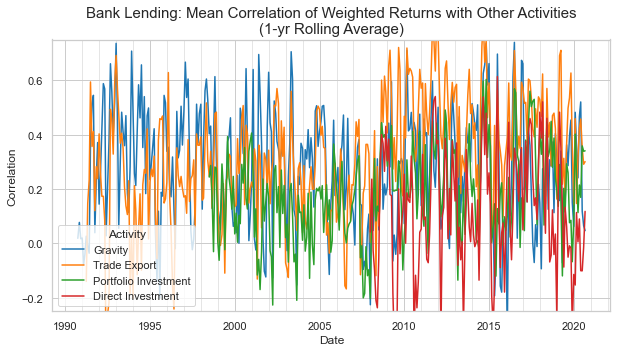

Direct Investment


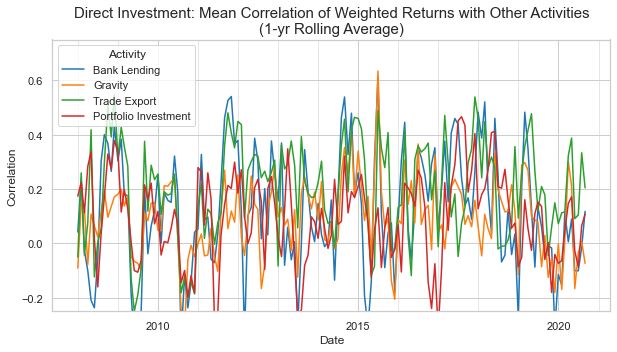

Gravity


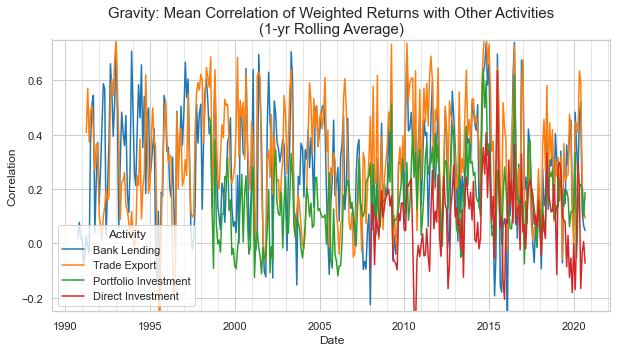

Portfolio Investment


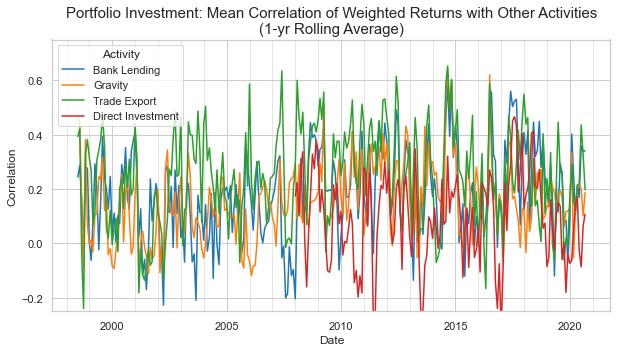

Trade Export


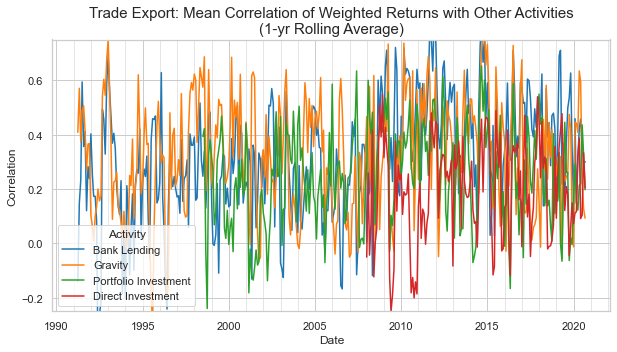

In [131]:
### TEST: RESULTS CORRELATIONS

for iter_activity in df_ret_corr.columns:
    print(iter_activity)
    list_activities = df_ret_corr.columns.to_list()
    list_activities.remove(iter_activity)
    ser_iter_corr = df_ret_corr.loc[(All, list_activities), iter_activity]
#    ser_iter_corr = df_ret_corr.loc[(All, list_activities), iter_activity].groupby('Activity', group_keys = False).rolling(12, 6).mean()    
    sns.set_style('whitegrid')
    plt.figure(figsize = (10, 5))
    sns.set_context('notebook')
    df_to_plot = ser_iter_corr.reset_index()
    ax_coverage = sns.lineplot(data = df_to_plot, x = 'Date', y = iter_activity, hue = 'Activity')
    ax_coverage.set_title(iter_activity + ': Mean Correlation of Weighted Returns with Other Activities\n(1-yr Rolling Average)', fontsize = 15)
    ax_coverage.set(ylim = (-0.25, 0.75), ylabel = 'Correlation')
    ### Major ticker options:    
    ax_coverage.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
    ax_coverage.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
    ### Minor ticker options:        
    ax_coverage.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
    ax_coverage.grid(visible = True, which = 'minor', linewidth = 0.5)    
    plt.show()



In [114]:
### TEMP

df_ret_corr.loc[(All, list_activities), iter_activity].groupby('Activity').rolling(12, 6).mean()

Activity           Date        Activity         
Direct Investment  2007-12-31  Direct Investment         NaN
                   2008-01-31  Direct Investment         NaN
                   2008-02-29  Direct Investment         NaN
                   2008-03-31  Direct Investment         NaN
                   2008-04-30  Direct Investment         NaN
                                                      ...   
Trade Export       2020-04-30  Trade Export         0.361731
                   2020-05-29  Trade Export         0.373767
                   2020-06-30  Trade Export         0.390108
                   2020-07-31  Trade Export         0.383458
                   2020-08-31  Trade Export         0.367063
Name: Bank Lending, Length: 1134, dtype: float64

In [79]:
### RUN EVERY TIME: HDF TO CSV

ser_activity_sum = pd.read_hdf(str_path_gravity_results, str_key_activity_sum)
ser_activity_sum.fillna(0.0).to_csv(str_activity_sum_csv_path, sep = ';', header = False)
ser_activity_share = pd.read_hdf(str_path_gravity_results, str_key_activity_share)
ser_activity_share.replace(0.0, np.NaN).to_csv(str_activity_share_csv_path, sep = ';', header = False)
ser_gdp_total = pd.read_hdf(str_path_gravity_results, str_key_gdp_total)
ser_gdp_total.to_csv(str_gdp_total_csv_path, sep = ';', header = False)
ser_herfindahl = pd.read_hdf(str_path_gravity_results, str_key_herfindahl)
ser_herfindahl.to_csv(str_herfindahl_csv_path, sep = ';', header = False)
ser_openess = pd.read_hdf(str_path_gravity_results, str_key_openess)
ser_openess.to_csv(str_openess_csv_path, sep = ';', header = False)
ser_ret_weighted = pd.read_hdf(str_path_gravity_results, str_key_ret_weighted)
ser_ret_weighted.to_csv(str_ret_weighted_csv_path, sep = ';', header = False)

In [92]:
### TEMP

df_ret_usd = pd.read_csv(str_path_ret_csv, header = None, sep = ';')
df_ret_usd.columns = ['Date', 'Country', 'Value']
ser_ret_usd = df_ret_usd.set_index(['Date', 'Country']).squeeze()
#ser_ret_usd = pd.read_hdf(str_path_bb_hdf, str_key_ret_daily).loc['USD']
ser_ret_usd

Date        Country
28.09.1990  AE        -0.001750
            AR        -0.001875
            AT        -0.001943
            AU        -0.001963
            BD        -0.001781
                         ...   
31.08.2020  UG         0.001801
            US         0.001626
            VN         0.001928
            ZA         0.001816
            ZM         0.001806
Name: Value, Length: 29016, dtype: float64